In [1]:
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from skrebate import ReliefF
import xgboost as xgb
import os
from itertools import combinations
from scipy.special import comb
from deap import base, creator, tools, algorithms
from prettytable import PrettyTable
import seaborn as sns
import matplotlib.pyplot as plt # Standard python libraries for data and visualisation

# SciKit Learn a python ML Library
# Import models
import sklearn
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error # Import error metric

# Import data munging tools
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.linear_model import Ridge, Lasso
from scipy.stats import bernoulli
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif, chi2, mutual_info_classif
from sklearn.metrics import make_scorer
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from sklearn.tree import DecisionTreeRegressor

random.seed(42) # set the random seed for reproducibility
np.random.seed(42) # fix the randomness numbers for the reproducibility


In [2]:
# download production data file
csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Production Data/Cement/cemex/cemex_csv_file/cemex_quarter_report_up_to_2024_version_1.csv' 
production_df = pd.read_csv(csv_file)

# download general index data
S_P_500_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/S_P_500.csv'
Russell_2000_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Russell_2000.csv'
NASDAQ_Composite_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/NASDAQ_Composite.csv'
Dow_jones_industrial_average_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Dow_jones_industrial_average.csv'

S_P_500_df = pd.read_csv(S_P_500_csv_file)
Russell_2000_df = pd.read_csv(Russell_2000_csv_file)
NASDAQ_Composite_df = pd.read_csv(NASDAQ_Composite_csv_file)
Dow_jones_industrial_average_df = pd.read_csv(Dow_jones_industrial_average_csv_file)

# download market index future
Nasdaq_100_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Nasdaq_100_Sep_24.csv'
E_mini_Russell_2000_Index_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/E_mini_Russell_2000_Index_Future.csv'
E_Mini_S_P_500_Sep_24_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/E_Mini_S_P_500_Sep_24_Future.csv'
Mini_Dow_Jones_Indus_future_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Mini_Dow_Jones_Indus_future_Sep_24.csv'
US_Treasury_Bond_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/US_Treasury_Bond_Futures.csv'

Nasdaq_100_Sep_24_df = pd.read_csv(Nasdaq_100_Sep_24_csv_file)
E_mini_Russell_2000_Index_Future_df = pd.read_csv(E_mini_Russell_2000_Index_Future_csv_file) # 2017-07-10
E_Mini_S_P_500_Sep_24_Future_df = pd.read_csv(E_Mini_S_P_500_Sep_24_Future_csv_file) # 2000-09-18
Mini_Dow_Jones_Indus_future_Sep_24_df = pd.read_csv(Mini_Dow_Jones_Indus_future_Sep_24_csv_file) # 2002-04-05
US_Treasury_Bond_Futures_df = pd.read_csv(US_Treasury_Bond_Futures_csv_file) # 2000-09-21

# download energy futures
oil_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Crude_Oil_Jul_24.csv'
brent_oil_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Brent Crude Oil Last Day Financ.csv'
Copper_Sep_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Copper_Sep_24.csv'
Corn_Futures_Dec_2024_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Corn_Futures_Dec_2024_future.csv'
Cotton_Oct_24_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Cotton_Oct_24_Futures.csv'
Sugar_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Sugar_Futures.csv'
Soybean_Oil_Futures_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Soybean_Oil_Futures_future.csv'
Soybean_Futures_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Soybean_Futures_future.csv'
silver_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/silver_future.csv'
RBOB_Gasoline_Aug_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/RBOB_Gasoline_Aug_24_future.csv'
Platinum_Oct_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Platinum_Oct_24_future.csv'
Palladium_Sep_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Palladium_Sep_24_future.csv'
Orange_Juice_Sep_24_Futures_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Orange_Juice_Sep_24_Futures.csv'
Natural_Gas_Aug_24_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Natural_Gas_Aug_24.csv'
Heating_Oil_Aug_24_future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Heating_Oil_Aug_24_future.csv'
Gold_Aug_24_Future_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Gold_Aug_24_Future.csv'

oil_csv_df = pd.read_csv(oil_csv_file)
brent_oil_future_df = pd.read_csv(brent_oil_csv_file)
Copper_Sep_24_df = pd.read_csv(Copper_Sep_24_csv_file)
Corn_Futures_Dec_2024_future_df = pd.read_csv(Corn_Futures_Dec_2024_future_csv_file)
Cotton_Oct_24_Futures_df = pd.read_csv(Cotton_Oct_24_Futures_csv_file)
Sugar_Futures_df = pd.read_csv(Sugar_Futures_csv_file)
Soybean_Oil_Futures_future_df = pd.read_csv(Soybean_Oil_Futures_future_csv_file)
Soybean_Futures_future_df = pd.read_csv(Soybean_Futures_future_csv_file)
silver_future_df = pd.read_csv(silver_future_csv_file)
RBOB_Gasoline_Aug_24_future_df = pd.read_csv(RBOB_Gasoline_Aug_24_future_csv_file)
Platinum_Oct_24_future_df = pd.read_csv(Platinum_Oct_24_future_csv_file)
Palladium_Sep_24_future_df = pd.read_csv(Palladium_Sep_24_future_csv_file)
Orange_Juice_Sep_24_Futures_df = pd.read_csv(Orange_Juice_Sep_24_Futures_csv_file)
Natural_Gas_Aug_24_df = pd.read_csv(Natural_Gas_Aug_24_csv_file)
Heating_Oil_Aug_24_future_df = pd.read_csv(Heating_Oil_Aug_24_future_csv_file)
Gold_Aug_24_Future_df = pd.read_csv(Gold_Aug_24_Future_csv_file)

# download etf futures


# download energy etf
Alerian_MLP_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Alerian_MLP_ETF.csv'
Fidelity_MSCI_Energy_Index_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Fidelity_MSCI_Energy_Index_ETF.csv'
First_Trust_North_American_Energy_Infrastructure_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/First_Trust_North_American_Energy_Infrastructure_Fund_ETF.csv'
Global_X_MLP_Energy_Infrastructure_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Global_X_MLP_Energy_Infrastructure_ETF.csv'
Global_X_MLP_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Global_X_MLP_ETF.csv'
iShares_Global_Clean_Energy_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/iShares_Global_Clean_Energy_ETF.csv'
iShares_Global_Energy_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/iShares_Global_Energy_ETF.csv'
MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs.csv'
SPDR_S_P_Oil_Gas_Exploration_Production_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/SPDR_S_P_Oil_Gas_Exploration_Production_ETF.csv'
The_Energy_Select_Sector_SPDR_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/The_Energy_Select_Sector_SPDR_Fund_ETF.csv'
VanEck_Oil_Services_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/VanEck_Oil_Services_ETF.csv'
Vanguard_Energy_Index_Fund_ETF_Shares_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/Energy ETF/Vanguard_Energy_Index_Fund_ETF_Shares_ETF.csv'

Alerian_MLP_ETF_df = pd.read_csv(Alerian_MLP_ETF_csv_file)
Fidelity_MSCI_Energy_Index_ETF_df = pd.read_csv(Fidelity_MSCI_Energy_Index_ETF_csv_file)
First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df = pd.read_csv(First_Trust_North_American_Energy_Infrastructure_Fund_ETF_csv_file)
Global_X_MLP_Energy_Infrastructure_ETF_df = pd.read_csv(Global_X_MLP_Energy_Infrastructure_ETF_csv_file)
Global_X_MLP_ETF_df = pd.read_csv(Global_X_MLP_ETF_csv_file)
iShares_Global_Clean_Energy_ETF_df = pd.read_csv(iShares_Global_Clean_Energy_ETF_csv_file)
MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df = pd.read_csv(MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_csv_file)
SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df = pd.read_csv(SPDR_S_P_Oil_Gas_Exploration_Production_ETF_csv_file)
The_Energy_Select_Sector_SPDR_Fund_ETF_df = pd.read_csv(The_Energy_Select_Sector_SPDR_Fund_ETF_csv_file)
VanEck_Oil_Services_ETF_df = pd.read_csv(VanEck_Oil_Services_ETF_csv_file)
Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df = pd.read_csv(Vanguard_Energy_Index_Fund_ETF_Shares_ETF_csv_file)


# download real estate etf
Dimensional_Global_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Dimensional_Global_Real_Estate_ETF.csv'
Dimensional_US_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Dimensional_US_Real_Estate_ETF.csv'
Fidelity_MSCI_Real_Estate_Index_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Fidelity_MSCI_Real_Estate_Index_ETF.csv'
Invesco_Active_US_Real_Estate_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_Active_US_Real_Estate_Fund_ETF.csv'
iShares_Cohen_Steers_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Cohen_Steers_REIT_ETF.csv'

iShares_Residential_and_Multisector_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Residential_and_Multisector_Real_Estate_ETF.csv'
iShares_Trust_iShares_Core_US_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_Trust_iShares_Core_US_REIT_ETF.csv'
iShares_U_S_Real_Estate_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_U_S_Real_Estate_ETF.csv'
JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/JPMorgan_BetaBuilders_MSCI_US_REIT_ETF.csv'

Vanguard_Real_Estate_Index_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Vanguard_Real_Estate_Index_Fund_ETF.csv'
Schwab_U_S_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Schwab_U_S_REIT_ETF.csv'
The_Real_Estate_Select_Sector_SPDR_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/The_Real_Estate_Select_Sector_SPDR_Fund_ETF.csv'
SPDR_Dow_Jones_REIT_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/SPDR_Dow_Jones_REIT_ETF.csv'

Dimensional_Global_Real_Estate_ETF_df = pd.read_csv(Dimensional_Global_Real_Estate_ETF_csv_file)
Dimensional_US_Real_Estate_ETF_df = pd.read_csv(Dimensional_US_Real_Estate_ETF_csv_file)
Fidelity_MSCI_Real_Estate_Index_ETF_df = pd.read_csv(Fidelity_MSCI_Real_Estate_Index_ETF_csv_file)
Invesco_Active_US_Real_Estate_Fund_ETF_df = pd.read_csv(Invesco_Active_US_Real_Estate_Fund_ETF_csv_file)
iShares_Cohen_Steers_REIT_ETF_df = pd.read_csv(iShares_Cohen_Steers_REIT_ETF_csv_file)
iShares_Residential_and_Multisector_Real_Estate_ETF_df = pd.read_csv(iShares_Residential_and_Multisector_Real_Estate_ETF_csv_file)
iShares_Trust_iShares_Core_US_REIT_ETF_df = pd.read_csv(iShares_Trust_iShares_Core_US_REIT_ETF_csv_file)
iShares_U_S_Real_Estate_ETF_df = pd.read_csv(iShares_U_S_Real_Estate_ETF_csv_file)
JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df = pd.read_csv(JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_csv_file)
Vanguard_Real_Estate_Index_Fund_ETF_df = pd.read_csv(Vanguard_Real_Estate_Index_Fund_ETF_csv_file)
Schwab_U_S_REIT_ETF_df = pd.read_csv(Schwab_U_S_REIT_ETF_csv_file)
The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df = pd.read_csv(The_Real_Estate_Select_Sector_SPDR_Fund_ETF_csv_file)
SPDR_Dow_Jones_REIT_ETF_df = pd.read_csv(SPDR_Dow_Jones_REIT_ETF_csv_file)

# other related etf
VanEck_Steel_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/VanEck_Steel_ETF.csv'
First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF.csv'
Invesco_Russell_2000_Dynamic_Multifactor_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_Russell_2000_Dynamic_Multifactor_ETF.csv'
Invesco_S_P_SmallCap_Value_with_Momentum_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/Invesco_S_P_SmallCap_Value_with_Momentum_ETF.csv'
iShares_MSCI_South_Africa_ETF_csv_file = '/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/Cemax/ETF/iShares_MSCI_South_Africa_ETF.csv'

VanEck_Steel_ETF_df = pd.read_csv(VanEck_Steel_ETF_csv_file)
First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df = pd.read_csv(First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_csv_file)
Invesco_Russell_2000_Dynamic_Multifactor_ETF_df = pd.read_csv(Invesco_Russell_2000_Dynamic_Multifactor_ETF_csv_file)
Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df = pd.read_csv(Invesco_S_P_SmallCap_Value_with_Momentum_ETF_csv_file)
iShares_MSCI_South_Africa_ETF_df = pd.read_csv(iShares_MSCI_South_Africa_ETF_csv_file)

In [3]:
# Read the CSV file
carbon_future_csv_file = "/Users/shiliurui/Desktop/2024 DSML MSc Project/Equity Data/carbon/Carbon Emissions Futures Historical Data.csv"
carbon_future_df = pd.read_csv(carbon_future_csv_file)

# Convert the "Date" column to datetime format
carbon_future_df['Date'] = pd.to_datetime(carbon_future_df['Date'], format='%m/%d/%Y')

# Rename the "Price" column to "Adj Close"
carbon_future_df.rename(columns={"Price": "Adj Close"}, inplace=True)

# Sort the DataFrame by the "Date" column in ascending order
carbon_future_df = carbon_future_df.sort_values(by='Date')

# Reset the index after sorting
carbon_future_df.reset_index(drop=True, inplace=True)

# Display the DataFrame to verify the changes
print(carbon_future_df)

           Date  Adj Close   Open   High    Low    Vol. Change %
0    2005-04-25      17.55  17.55  17.55  17.55     NaN    3.54%
1    2005-04-26      17.20  17.20  17.20  17.20     NaN   -1.99%
2    2005-04-27      16.45  16.45  16.45  16.45     NaN   -4.36%
3    2005-04-28      16.00  16.00  16.00  16.00     NaN   -2.74%
4    2005-04-29      16.50  16.50  16.50  16.50     NaN    3.13%
...         ...        ...    ...    ...    ...     ...      ...
4985 2024-07-16      67.94  67.85  68.27  67.16  18.32K    0.53%
4986 2024-07-17      66.42  68.01  68.13  66.41  19.67K   -2.24%
4987 2024-07-18      66.11  66.43  66.98  66.01  17.93K   -0.47%
4988 2024-07-19      66.00  66.35  67.49  65.73  15.46K   -0.17%
4989 2024-07-22      64.79  66.28  66.73  64.25  25.44K   -1.83%

[4990 rows x 7 columns]


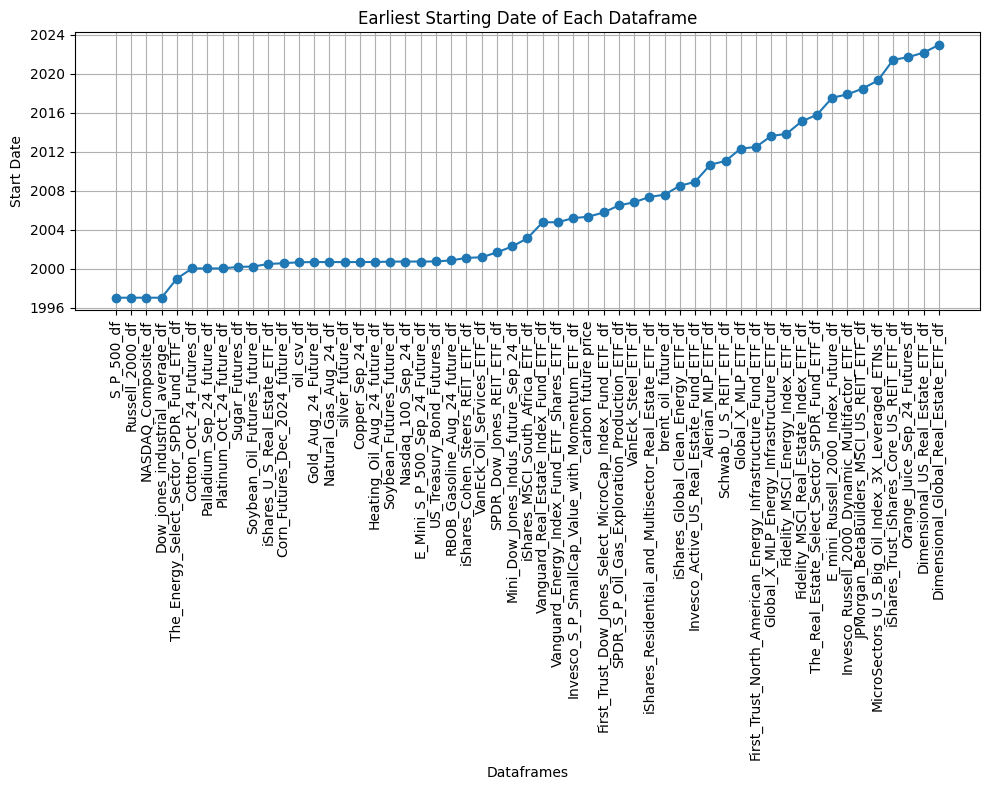

                                    Dataframe Start Date
0                                  S_P_500_df 1997-01-02
1                             Russell_2000_df 1997-01-02
2                         NASDAQ_Composite_df 1997-01-02
3             Dow_jones_industrial_average_df 1997-01-02
4                        Nasdaq_100_Sep_24_df 2000-09-18
5             E_Mini_S_P_500_Sep_24_Future_df 2000-09-18
6                 US_Treasury_Bond_Futures_df 2000-09-21
7                                  oil_csv_df 2000-08-23
8                            Copper_Sep_24_df 2000-08-30
9             Corn_Futures_Dec_2024_future_df 2000-07-17
10                   Cotton_Oct_24_Futures_df 2000-01-03
11                           Sugar_Futures_df 2000-03-01
12              Soybean_Oil_Futures_future_df 2000-03-15
13                  Soybean_Futures_future_df 2000-09-15
14                           silver_future_df 2000-08-30
15             RBOB_Gasoline_Aug_24_future_df 2000-11-01
16                  Platinum_Oc

In [4]:
# Dictionary of dataframes with their variable names
dfs = {
    'S_P_500_df': S_P_500_df,
    'Russell_2000_df': Russell_2000_df, 'NASDAQ_Composite_df': NASDAQ_Composite_df,
    'Dow_jones_industrial_average_df': Dow_jones_industrial_average_df, 'Nasdaq_100_Sep_24_df': Nasdaq_100_Sep_24_df,
    'E_mini_Russell_2000_Index_Future_df': E_mini_Russell_2000_Index_Future_df, 'E_Mini_S_P_500_Sep_24_Future_df': E_Mini_S_P_500_Sep_24_Future_df,
    'Mini_Dow_Jones_Indus_future_Sep_24_df': Mini_Dow_Jones_Indus_future_Sep_24_df, 'US_Treasury_Bond_Futures_df': US_Treasury_Bond_Futures_df,
    'oil_csv_df': oil_csv_df, 'brent_oil_future_df': brent_oil_future_df, 'Copper_Sep_24_df': Copper_Sep_24_df,
    'Corn_Futures_Dec_2024_future_df': Corn_Futures_Dec_2024_future_df, 'Cotton_Oct_24_Futures_df': Cotton_Oct_24_Futures_df,
    'Sugar_Futures_df': Sugar_Futures_df, 'Soybean_Oil_Futures_future_df': Soybean_Oil_Futures_future_df,
    'Soybean_Futures_future_df': Soybean_Futures_future_df, 'silver_future_df': silver_future_df,
    'RBOB_Gasoline_Aug_24_future_df': RBOB_Gasoline_Aug_24_future_df, 'Platinum_Oct_24_future_df': Platinum_Oct_24_future_df,
    'Palladium_Sep_24_future_df': Palladium_Sep_24_future_df, 'Orange_Juice_Sep_24_Futures_df': Orange_Juice_Sep_24_Futures_df,
    'Natural_Gas_Aug_24_df': Natural_Gas_Aug_24_df, 'Heating_Oil_Aug_24_future_df': Heating_Oil_Aug_24_future_df,
    'Gold_Aug_24_Future_df': Gold_Aug_24_Future_df, 'Alerian_MLP_ETF_df': Alerian_MLP_ETF_df,
    'Fidelity_MSCI_Energy_Index_ETF_df': Fidelity_MSCI_Energy_Index_ETF_df, 'First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df': First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df,
    'Global_X_MLP_Energy_Infrastructure_ETF_df': Global_X_MLP_Energy_Infrastructure_ETF_df, 'Global_X_MLP_ETF_df': Global_X_MLP_ETF_df,
    'iShares_Global_Clean_Energy_ETF_df': iShares_Global_Clean_Energy_ETF_df, 'MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df': MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df,
    'SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df': SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df, 'The_Energy_Select_Sector_SPDR_Fund_ETF_df': The_Energy_Select_Sector_SPDR_Fund_ETF_df,
    'VanEck_Oil_Services_ETF_df': VanEck_Oil_Services_ETF_df, 'Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df': Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df,
    'Dimensional_Global_Real_Estate_ETF_df': Dimensional_Global_Real_Estate_ETF_df, 'Dimensional_US_Real_Estate_ETF_df': Dimensional_US_Real_Estate_ETF_df,
    'Fidelity_MSCI_Real_Estate_Index_ETF_df': Fidelity_MSCI_Real_Estate_Index_ETF_df, 'Invesco_Active_US_Real_Estate_Fund_ETF_df': Invesco_Active_US_Real_Estate_Fund_ETF_df,
    'iShares_Cohen_Steers_REIT_ETF_df': iShares_Cohen_Steers_REIT_ETF_df, 'iShares_Residential_and_Multisector_Real_Estate_ETF_df': iShares_Residential_and_Multisector_Real_Estate_ETF_df,
    'iShares_Trust_iShares_Core_US_REIT_ETF_df': iShares_Trust_iShares_Core_US_REIT_ETF_df, 'iShares_U_S_Real_Estate_ETF_df': iShares_U_S_Real_Estate_ETF_df,
    'JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df': JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df, 'Vanguard_Real_Estate_Index_Fund_ETF_df': Vanguard_Real_Estate_Index_Fund_ETF_df,
    'Schwab_U_S_REIT_ETF_df': Schwab_U_S_REIT_ETF_df, 'The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df': The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df,
    'SPDR_Dow_Jones_REIT_ETF_df': SPDR_Dow_Jones_REIT_ETF_df, 'VanEck_Steel_ETF_df': VanEck_Steel_ETF_df,
    'First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df': First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df,
    'Invesco_Russell_2000_Dynamic_Multifactor_ETF_df': Invesco_Russell_2000_Dynamic_Multifactor_ETF_df,
    'Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df': Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df,
    'iShares_MSCI_South_Africa_ETF_df': iShares_MSCI_South_Africa_ETF_df,
    'carbon future price': carbon_future_df
}

# Extract the earliest date from each dataframe
start_dates = []
names = []
filtered_dfs = []

# Set the criterion date
criterion_date = pd.to_datetime('2000-12-31')

# Optional: List of user-defined starting points
user_defined_starting_points = ['carbon future price']  # Add more assets as needed

# Loop through the dataframes
for name, df in dfs.items():
    if not df.empty:
        start_date = pd.to_datetime(df['Date'].iloc[0])
        start_dates.append(start_date)
        names.append(name)
        # Check if the start date is before the criterion date or matches any user-defined starting point
        if start_date < criterion_date or name in user_defined_starting_points:
            filtered_dfs.append(df)

# Create a new dataframe with the starting dates
start_dates_df = pd.DataFrame({'Dataframe': names, 'Start Date': start_dates})

# Sort by start date
start_dates_df = start_dates_df.sort_values(by='Start Date')

# Plotting
plt.figure(figsize=(10, 8))
plt.plot(start_dates_df['Dataframe'], start_dates_df['Start Date'], marker='o')
plt.xticks(rotation=90)
plt.xlabel('Dataframes')
plt.ylabel('Start Date')
plt.title('Earliest Starting Date of Each Dataframe')
plt.grid(True)
plt.tight_layout()
plt.show()

# Display the filtered dataframes' names and their start dates
filtered_dfs_names_dates = [(names[i], start_dates[i]) for i, df in enumerate(dfs.values()) if start_dates[i] < criterion_date or names[i] in user_defined_starting_points]
filtered_dfs_names_dates_df = pd.DataFrame(filtered_dfs_names_dates, columns=['Dataframe', 'Start Date'])
print(filtered_dfs_names_dates_df)


In [5]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Function to assign quarter labels
def get_quarter_label(date):
    year = date.year
    month = date.month
    if month in [1, 2, 3]:
        quarter = 1
    elif month in [4, 5, 6]:
        quarter = 2
    elif month in [7, 8, 9]:
        quarter = 3
    else:
        quarter = 4
    return f"{year}_Q{quarter}"

# Function to process a single dataframe and return a summary with a custom column name
def process_dataframe(df, name, col_date='Date', col_adj_close='Adj Close'):
    df = df.copy()  # Make a copy to avoid modifying the original DataFrame
    df[col_date] = pd.to_datetime(df[col_date])
    df['quarter'] = df[col_date].apply(get_quarter_label)
    print(f"df, {df}")
    df_summary = df.groupby('quarter')[col_adj_close].mean().reset_index()
    df_summary.columns = ['Quarter', f'{name} Adj Close Average']

    return df_summary

# Function to merge multiple dataframes with the original dataframe
def merge_dataframes(original_df, dfs_summaries, key='Release_quarter'):
    merged_df = original_df.copy()
    for df_summary in dfs_summaries:
        merged_df = pd.merge(merged_df, df_summary, left_on=key, right_on='Quarter').drop(columns=['Quarter'])
    return merged_df

dfs = {
    'S_P_500_df': S_P_500_df, 'Russell_2000_df': Russell_2000_df, 'NASDAQ_Composite_df': NASDAQ_Composite_df,
    'Dow_jones_industrial_average_df': Dow_jones_industrial_average_df, 'Nasdaq_100_Sep_24_df': Nasdaq_100_Sep_24_df,
    'E_mini_Russell_2000_Index_Future_df': E_mini_Russell_2000_Index_Future_df, 'E_Mini_S_P_500_Sep_24_Future_df': E_Mini_S_P_500_Sep_24_Future_df,
    'Mini_Dow_Jones_Indus_future_Sep_24_df': Mini_Dow_Jones_Indus_future_Sep_24_df, 'US_Treasury_Bond_Futures_df': US_Treasury_Bond_Futures_df,
    'oil_csv_df': oil_csv_df, 'brent_oil_future_df': brent_oil_future_df, 'Copper_Sep_24_df': Copper_Sep_24_df,
    'Corn_Futures_Dec_2024_future_df': Corn_Futures_Dec_2024_future_df, 'Cotton_Oct_24_Futures_df': Cotton_Oct_24_Futures_df,
    'Sugar_Futures_df': Sugar_Futures_df, 'Soybean_Oil_Futures_future_df': Soybean_Oil_Futures_future_df,
    'Soybean_Futures_future_df': Soybean_Futures_future_df, 'silver_future_df': silver_future_df,
    'RBOB_Gasoline_Aug_24_future_df': RBOB_Gasoline_Aug_24_future_df, 'Platinum_Oct_24_future_df': Platinum_Oct_24_future_df,
    'Palladium_Sep_24_future_df': Palladium_Sep_24_future_df, 'Orange_Juice_Sep_24_Futures_df': Orange_Juice_Sep_24_Futures_df,
    'Natural_Gas_Aug_24_df': Natural_Gas_Aug_24_df, 'Heating_Oil_Aug_24_future_df': Heating_Oil_Aug_24_future_df,
    'Gold_Aug_24_Future_df': Gold_Aug_24_Future_df, 'Alerian_MLP_ETF_df': Alerian_MLP_ETF_df,
    'Fidelity_MSCI_Energy_Index_ETF_df': Fidelity_MSCI_Energy_Index_ETF_df, 'First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df': First_Trust_North_American_Energy_Infrastructure_Fund_ETF_df,
    'Global_X_MLP_Energy_Infrastructure_ETF_df': Global_X_MLP_Energy_Infrastructure_ETF_df, 'Global_X_MLP_ETF_df': Global_X_MLP_ETF_df,
    'iShares_Global_Clean_Energy_ETF_df': iShares_Global_Clean_Energy_ETF_df, 'MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df': MicroSectors_U_S_Big_Oil_Index_3X_Leveraged_ETNs_df,
    'SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df': SPDR_S_P_Oil_Gas_Exploration_Production_ETF_df, 'The_Energy_Select_Sector_SPDR_Fund_ETF_df': The_Energy_Select_Sector_SPDR_Fund_ETF_df,
    'VanEck_Oil_Services_ETF_df': VanEck_Oil_Services_ETF_df, 'Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df': Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df,
    'Dimensional_Global_Real_Estate_ETF_df': Dimensional_Global_Real_Estate_ETF_df, 'Dimensional_US_Real_Estate_ETF_df': Dimensional_US_Real_Estate_ETF_df,
    'Fidelity_MSCI_Real_Estate_Index_ETF_df': Fidelity_MSCI_Real_Estate_Index_ETF_df, 'Invesco_Active_US_Real_Estate_Fund_ETF_df': Invesco_Active_US_Real_Estate_Fund_ETF_df,
    'iShares_Cohen_Steers_REIT_ETF_df': iShares_Cohen_Steers_REIT_ETF_df, 'iShares_Residential_and_Multisector_Real_Estate_ETF_df': iShares_Residential_and_Multisector_Real_Estate_ETF_df,
    'iShares_Trust_iShares_Core_US_REIT_ETF_df': iShares_Trust_iShares_Core_US_REIT_ETF_df, 'iShares_U_S_Real_Estate_ETF_df': iShares_U_S_Real_Estate_ETF_df,
    'JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df': JPMorgan_BetaBuilders_MSCI_US_REIT_ETF_df, 'Vanguard_Real_Estate_Index_Fund_ETF_df': Vanguard_Real_Estate_Index_Fund_ETF_df,
    'Schwab_U_S_REIT_ETF_df': Schwab_U_S_REIT_ETF_df, 'The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df': The_Real_Estate_Select_Sector_SPDR_Fund_ETF_df,
    'SPDR_Dow_Jones_REIT_ETF_df': SPDR_Dow_Jones_REIT_ETF_df, 'VanEck_Steel_ETF_df': VanEck_Steel_ETF_df,
    'First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df': First_Trust_Dow_Jones_Select_MicroCap_Index_Fund_ETF_df,
    'Invesco_Russell_2000_Dynamic_Multifactor_ETF_df': Invesco_Russell_2000_Dynamic_Multifactor_ETF_df,
    'Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df': Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df,
    'iShares_MSCI_South_Africa_ETF_df': iShares_MSCI_South_Africa_ETF_df,
    'carbon future price': carbon_future_df

}

# Extract the earliest date from each dataframe
start_dates = []
names = []
filtered_dfs = []

# Set the criterion date
criterion_date = pd.to_datetime('2005-04-26')

for name, df in dfs.items():
    if not df.empty:
        start_date = pd.to_datetime(df['Date'].iloc[0])
        start_dates.append(start_date)
        names.append(name)
        # Check if the start date is before the criterion date
        if start_date < criterion_date:
            filtered_dfs.append((name, df))

# Process each filtered dataframe and store the summaries
dfs_summaries = []
for name, df in filtered_dfs:
    dfs_summaries.append(process_dataframe(df, name))

# Merge all summaries with the original dataframe
final_df = merge_dataframes(production_df, dfs_summaries)


df,            Date         Open         High          Low        Close  \
0    1997-01-02   740.739990   742.809998   729.549988   737.010010   
1    1997-01-03   737.010010   748.239990   737.010010   748.030029   
2    1997-01-06   748.030029   753.309998   743.820007   747.650024   
3    1997-01-07   747.650024   753.260010   742.179993   753.229980   
4    1997-01-08   753.229980   755.719971   747.710022   748.409973   
...         ...          ...          ...          ...          ...   
6850 2024-03-22  5242.479980  5246.089844  5229.870117  5234.180176   
6851 2024-03-25  5219.520020  5229.089844  5216.089844  5218.189941   
6852 2024-03-26  5228.850098  5235.160156  5203.419922  5203.580078   
6853 2024-03-27  5226.310059  5249.259766  5213.919922  5248.490234   
6854 2024-03-28  5248.029785  5264.850098  5245.819824  5254.350098   

        Adj Close      Volume  quarter  
0      737.010010   463230000  1997_Q1  
1      748.030029   452970000  1997_Q1  
2      747.650024   

In [6]:
selected_asset_df_final = carbon_future_df
selected_asset_df_final

,Date,Adj Close,Open,High,Low,Vol.,Change %
0,2005-04-25,17.55,17.55,17.55,17.55,NaN,3.54%
1,2005-04-26,17.20,17.20,17.20,17.20,NaN,-1.99%
2,2005-04-27,16.45,16.45,16.45,16.45,NaN,-4.36%
3,2005-04-28,16.00,16.00,16.00,16.00,NaN,-2.74%
4,2005-04-29,16.50,16.50,16.50,16.50,NaN,3.13%
...,...,...,...,...,...,...,...
4985,2024-07-16,67.94,67.85,68.27,67.16,18.32K,0.53%
4986,2024-07-17,66.42,68.01,68.13,66.41,19.67K,-2.24%
4987,2024-07-18,66.11,66.43,66.98,66.01,17.93K,-0.47%
4988,2024-07-19,66.00,66.35,67.49,65.73,15.46K,-0.17%


In [9]:
from scipy.signal import correlate
# Function to get the quarter label
def get_quarter_label(date):
    year = date.year
    month = date.month
    if month in [1, 2, 3]:
        quarter = 1
    elif month in [4, 5, 6]:
        quarter = 2
    elif month in [7, 8, 9]:
        quarter = 3
    else:
        quarter = 4
    return f"{year}_Q{quarter}"

# Function to calculate RSI
def calculate_rsi(series, window):
    delta = series.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Function to extract features
def feature_extraction_on_graph(time_series_df):
    length_of_time_series_df = time_series_df.shape[0]
    mean = time_series_df['Adj Close'].mean()
    std = time_series_df['Adj Close'].std()
    # slope = np.polyfit(range(length_of_time_series_df), time_series_df['Close'], 1)[0]
    momentum = (time_series_df['Adj Close'].iloc[-1] / time_series_df['Adj Close'].iloc[0]) - 1
    rsi = calculate_rsi(time_series_df['Adj Close'], length_of_time_series_df).iloc[-1]
    X_i = [mean, std, momentum, rsi]
    return X_i

# Function to process a single dataframe
def process_dataframe(df, name, col_date='Date', col_adj_close='Adj Close'):
    df = df.copy()
    df[col_date] = pd.to_datetime(df[col_date])
    df['quarter'] = df[col_date].apply(get_quarter_label)
    df_summary = df.groupby('quarter').apply(lambda x: feature_extraction_on_graph(x), include_groups=False).reset_index()
    df_summary.columns = ['Quarter', f'{name} Graph Representation Vector']
    return df_summary


# Function to merge multiple dataframes
def merge_dataframes(original_df, dfs_summaries, key='Release_quarter'):
    merged_df = original_df.copy()
    for df_summary in dfs_summaries:
        merged_df = pd.merge(merged_df, df_summary, left_on=key, right_on='Quarter').drop(columns=['Quarter'])
    return merged_df

# Extract the earliest date from each dataframe
start_dates = []
names = []
filtered_dfs = []

# Set the criterion date
criterion_date = pd.to_datetime('2005-04-26')

for name, df in dfs.items():
    if not df.empty:
        start_date = pd.to_datetime(df['Date'].iloc[0])
        start_dates.append(start_date)
        names.append(name)
        if start_date < criterion_date:
            filtered_dfs.append((name, df))

# Process each filtered dataframe and store the summaries
dfs_summaries = []
for name, df in filtered_dfs:
    dfs_summaries.append(process_dataframe(df, name))

# Merge all summaries with the original dataframe
final_df = merge_dataframes(production_df, dfs_summaries)
final_df


,Release_quarter,net_sales,cost_of_sales,gross_profit,cash_and_temporary_investment,trade_accounts_receivables,other_receivables,inventories,other_current_assets,fixed_assets,...,The_Energy_Select_Sector_SPDR_Fund_ETF_df Graph Representation Vector,VanEck_Oil_Services_ETF_df Graph Representation Vector,Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df Graph Representation Vector,iShares_Cohen_Steers_REIT_ETF_df Graph Representation Vector,iShares_U_S_Real_Estate_ETF_df Graph Representation Vector,Vanguard_Real_Estate_Index_Fund_ETF_df Graph Representation Vector,SPDR_Dow_Jones_REIT_ETF_df Graph Representation Vector,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector,carbon future price Graph Representation Vector
0,2005_Q2,4375937,2585820,1790117,1264807,1870546,609973,1116917,175715,13289809,...,"[24.539376735687256, 1.132818198344623, 0.0149...","[445.2395553588867, 24.440212380333488, 0.0340...","[38.23656874895096, 1.7811008907985186, 0.0109...","[17.82306942343712, 0.8524752632305092, 0.1524...","[29.48484206199646, 1.3594418462416245, 0.1419...","[24.394707441329956, 1.1319498090611468, 0.144...","[30.44183686375618, 1.4472247312270343, 0.1487...","[10.668339118361473, 0.36257598456477313, 0.06...","[17.901366412639618, 0.41236626378588986, -0.0...","[19.435106382978724, 2.684170888375375, 0.4700..."
1,2005_Q3,4298068,2489581,1808487,512486,1795423,726536,1109255,181720,13228426,...,"[28.777931660413742, 1.5601122187294494, 0.184...","[539.4877843856812, 29.967000475874777, 0.2069...","[44.83312600851059, 2.4095721588760073, 0.1931...","[19.646837323904037, 0.41848378622880256, 0.03...","[32.022678911685944, 0.6967954836836825, 0.012...","[26.72459188103676, 0.5556117928867815, 0.0328...","[33.52713197469711, 0.702088666815246, 0.02792...","[11.44332505762577, 0.17573723380796497, 0.019...","[20.499617993831635, 1.2793155838584869, 0.294...","[23.485384615384614, 2.5346308144155065, -0.15..."
2,2005_Q4,3962557,2599091,1363466,601452,1592667,775526,1037183,159817,15541789,...,"[29.077976892864893, 1.043236569524381, -0.057...","[574.1844588991196, 37.80484425551413, 0.04437...","[45.56327904595269, 1.5998434174941547, -0.059...","[19.61254740518237, 0.7797899043456894, 0.0272...","[31.55793559362018, 1.1161249469127847, 0.0096...","[26.61300301930261, 0.9080039140596221, 0.0148...","[33.4886102222261, 1.2360209607190973, 0.01895...","[11.34340943230523, 0.310703701473463, -0.0071...","[22.365888958885556, 1.4247549485328848, 0.106...","[22.112499999999997, 0.895314079855389, -0.028..."
3,2006_Q1,3928749,2515485,1413264,687796,1569759,802893,1128150,208864,15576004,...,"[31.606936300954512, 0.9685737250324141, 0.035...","[673.7586246613533, 28.79671063932898, 0.08329...","[49.37142950488675, 1.5141853874659266, 0.0423...","[22.16307347820651, 0.8559331429351252, 0.1335...","[35.14723747007309, 1.2146190406868158, 0.1222...","[29.7623902597735, 1.0449343943323666, 0.12435...","[37.73204009763656, 1.4261615808936334, 0.1346...","[12.06382256169473, 0.19155413061683177, 0.068...","[27.859009496627316, 0.9686751833569209, 0.105...","[27.076562499999998, 1.603566678149007, 0.2483..."
4,2006_Q2,4613517,2860137,1753380,707945,1644998,982251,1170277,151604,15915601,...,"[32.638884377858, 1.4075661249153524, 0.041315...","[713.1404913039435, 42.657870652237165, 0.0169...","[51.25304891192724, 2.3294213687954426, 0.0369...","[22.3732481759692, 0.38338419854684014, 0.0056...","[35.518458230154856, 0.5937406923913929, 0.000...","[29.960909707205637, 0.5003808876851331, 0.003...","[38.08720585656545, 0.6830467426751956, 0.0065...","[12.160127094813756, 0.3606083517438388, -0.02...","[27.394291378202894, 3.0527918919421104, -0.17...","[19.550793650793647, 6.5413479674243575, -0.41..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,2023_Q1,4035801,2746129,1289672,757806,1909796,525142,1767411,139373,11639315,...,"[

In [10]:
# Obtain the list of all columns from final_df
all_columns = final_df.columns

# Columns to exclude
excluded_columns = [
    'cost_of_sales', 'gross_profit', 'cash_and_temporary_investment',
    'trade_accounts_receivables', 'other_receivables', 'inventories',
    'other_current_assets', 'fixed_assets', 'other_assets',
    'total_liabilities', 'consolidated_stockholder_equity', 'profit_margin',
    'number_of_unit_sold', 'unit_cost', 'unit_profit'
]

# Define the columns to select by excluding the unwanted columns
columns_to_select = [col for col in all_columns if col not in excluded_columns]

# Select the specified columns from final_df
selected_columns_df = final_df[columns_to_select]

# Display the selected columns dataframe
selected_columns_df


,Release_quarter,net_sales,average_price_per_ton,S_P_500_df Graph Representation Vector,Russell_2000_df Graph Representation Vector,NASDAQ_Composite_df Graph Representation Vector,Dow_jones_industrial_average_df Graph Representation Vector,Nasdaq_100_Sep_24_df Graph Representation Vector,E_Mini_S_P_500_Sep_24_Future_df Graph Representation Vector,Mini_Dow_Jones_Indus_future_Sep_24_df Graph Representation Vector,...,The_Energy_Select_Sector_SPDR_Fund_ETF_df Graph Representation Vector,VanEck_Oil_Services_ETF_df Graph Representation Vector,Vanguard_Energy_Index_Fund_ETF_Shares_ETF_df Graph Representation Vector,iShares_Cohen_Steers_REIT_ETF_df Graph Representation Vector,iShares_U_S_Real_Estate_ETF_df Graph Representation Vector,Vanguard_Real_Estate_Index_Fund_ETF_df Graph Representation Vector,SPDR_Dow_Jones_REIT_ETF_df Graph Representation Vector,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector,carbon future price Graph Representation Vector
0,2005_Q2,4375937,91.00,"[1181.9740562438965, 20.467449087577336, 0.015...","[610.9015655517578, 19.519278067370898, 0.0459...","[2013.2076530456543, 60.09461409742153, 0.0363...","[10383.979370117188, 156.71226815138348, -0.01...","[1494.0853118896484, 46.01681561453646, 0.0155...","[1184.0301570892334, 20.969469814235726, 0.015...","[10393.90625, 160.37017879279097, -0.012366983...",...,"[24.539376735687256, 1.132818198344623, 0.0149...","[445.2395553588867, 24.440212380333488, 0.0340...","[38.23656874895096, 1.7811008907985186, 0.0109...","[17.82306942343712, 0.8524752632305092, 0.1524...","[29.48484206199646, 1.3594418462416245, 0.1419...","[24.394707441329956, 1.1319498090611468, 0.144...","[30.44183686375618, 1.4472247312270343, 0.1487...","[10.668339118361473, 0.36257598456477313, 0.06...","[17.901366412639618, 0.41236626378588986, -0.0...","[19.435106382978724, 2.684170888375375, 0.4700..."
1,2005_Q3,4298068,91.00,"[1224.1743774414062, 11.637632573969478, 0.028...","[664.6226539611816, 10.265717818419166, 0.0385...","[2149.533435821533, 32.617036612908095, 0.0458...","[10544.36245727539, 103.69808932899902, 0.0257...","[1586.8346881866455, 27.27991523537522, 0.0760...","[1227.0357818603516, 11.091837131878405, 0.028...","[10562.171875, 99.88033390608221, 0.0270008709...",...,"[28.777931660413742, 1.5601122187294494, 0.184...","[539.4877843856812, 29.967000475874777, 0.2069...","[44.83312600851059, 2.4095721588760073, 0.1931...","[19.646837323904037, 0.41848378622880256, 0.03...","[32.022678911685944, 0.6967954836836825, 0.012...","[26.72459188103676, 0.5556117928867815, 0.0328...","[33.52713197469711, 0.702088666815246, 0.02792...","[11.44332505762577, 0.17573723380796497, 0.019...","[20.499617993831635, 1.2793155838584869, 0.294...","[23.485384615384614, 2.5346308144155065, -0.15..."
2,2005_Q4,3962557,91.00,"[1230.468253968254, 32.189772766783825, 0.0176...","[662.5858745272197, 21.32963756296141, 0.00398...","[2178.6719021267363, 74.14470941331875, 0.0231...","[10615.78583829365, 239.93100005205525, 0.0172...","[1641.3759384155273, 57.83973826254261, 0.0250...","[1234.2279682159424, 32.32848865514444, 0.0186...","[10636.984126984127, 244.03308157967837, 0.016...",...,"[29.077976892864893, 1.043236569524381, -0.057...","[574.1844588991196, 37.80484425551413, 0.04437...","[45.56327904595269, 1.5998434174941547, -0.059...","[19.61254740518237, 0.7797899043456894, 0.0272...","[31.55793559362018, 1.1161249469127847, 0.0096...","[26.61300301930261, 0.9080039140596221, 0.0148...","[33.4886102222261, 1.2360209607190973, 0.01895...","[11.34340943230523, 0.310703701473463, -0.0071...","[22.365888958885556, 1.4247549485328848, 0.106...","[22.112499999999997, 0.895314079855389, -0.028..."
3,2006_Q1,3928749,101.50,"[1283.6550017326108, 13.294028559382012, 0.020...","[726.9385474420363, 17.85735416123426, 0.11854...","[2288.7962961504536, 26.059831540850794, 0.042...","[11003.621456023186, 163.2314664435265

## Part 1: Data Analysis

### Part 1.1 Data without transformation

In [12]:
# Load the data
X, y = selected_columns_df.iloc[:, 3:], np.ravel(selected_columns_df[['net_sales']])

In [13]:
df = X

# Extract each feature into separate columns
def extract_features(df, column):
    feature_columns = pd.DataFrame(df[column].tolist(), columns=[f"{column}_feature_{i}" for i in range(len(df[column].iloc[0]))])
    return feature_columns

# Concatenate all feature columns
feature_dfs = [extract_features(df, col) for col in df.columns]
transformed_asset_features = pd.concat(feature_dfs, axis=1)

# Standardize each feature column
scaler = MinMaxScaler()
standardized_values = scaler.fit_transform(transformed_asset_features)
standardized_df = pd.DataFrame(standardized_values, columns=transformed_asset_features.columns)

# Extract and standardize the third column
third_column = selected_columns_df.iloc[:, 2].values.reshape(-1, 1)
standardized_third_column = scaler.fit_transform(third_column)
standardized_third_column_df = pd.DataFrame(standardized_third_column, columns=["average_price_per_ton"])

# Concatenate the standardized third column to the left side of standardized_df
result_df = pd.concat([standardized_third_column_df, standardized_df], axis=1)

# Display the resulting dataframe
result_df


,average_price_per_ton,S_P_500_df Graph Representation Vector_feature_0,S_P_500_df Graph Representation Vector_feature_1,S_P_500_df Graph Representation Vector_feature_2,S_P_500_df Graph Representation Vector_feature_3,Russell_2000_df Graph Representation Vector_feature_0,Russell_2000_df Graph Representation Vector_feature_1,Russell_2000_df Graph Representation Vector_feature_2,Russell_2000_df Graph Representation Vector_feature_3,NASDAQ_Composite_df Graph Representation Vector_feature_0,...,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_2,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_3,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_0,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_1,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_2,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_3,carbon future price Graph Representation Vector_feature_0,carbon future price Graph Representation Vector_feature_1,carbon future price Graph Representation Vector_feature_2,carbon future price Graph Representation Vector_feature_3
0,0.028868,0.089443,0.026258,0.498443,0.458551,0.097698,0.040387,0.542542,0.572644,0.037289,...,0.582956,0.700510,0.000000,0.000000,0.542286,0.370830,0.218583,0.279707,0.004199,0.724439
1,0.028868,0.099527,0.000000,0.525864,0.549348,0.126798,0.000000,0.531113,0.552016,0.046883,...,0.528483,0.596076,0.076649,0.140318,0.972585,1.000000,0.264386,0.264001,0.002260,0.284672
2,0.028868,0.101031,0.061117,0.502435,0.478448,0.125695,0.048288,0.478225,0.446766,0.048934,...,0.495673,0.515620,0.131704,0.163858,0.718112,0.628979,0.248861,0.091820,0.002641,0.348148
3,0.230947,0.113740,0.004926,0.508614,0.511471,0.160554,0.033133,0.653730,0.856218,0.056684,...,0.589085,0.784973,0.293751,0.090040,0.717208,0.558304,0.304998,0.166209,0.003506,0.554402
4,0.230947,0.113061,0.047712,0.420933,0.284415,0.164097,0.098017,0.402410,0.314237,0.052953,...,0.476592,0.473280,0.280042,0.427360,0.340033,0.221464,0.219891,0.684834,0.001430,0.230194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.866628,0.762842,0.225822,0.621879,0.611410,0.772403,0.297669,0.517408,0.497591,0.703660,...,0.514115,0.550868,0.689045,0.314028,0.528273,0.357347,0.987523,0.645363,0.003032,0.415120
72,0.866628,0.812069,0.293059,0.631181,0.757864,0.740535,0.173905,0.545582,0.564210,0.787786,...,0.525300,0.573311,0.627723,0.221907,0.504113,0.321126,1.000000,0.485179,0.002521,0.320199
73,0.866628,0.872301,0.197291,0.386700,0.194158,0.791507,0.230007,0.381925,0.247107,0.865803,...,0.541842,0.618650,0.626859,0.244003,0.498391,0.330442,0.968115,0.297215,0.002512,0.304000
74,0.866628,0.873919,0.534291,0.700908,0.878728,0.745443,0.478798,0.707786,0.768011,0.874630,...,0.679381,0.832747,0.600557,0.202821,0.786247,0.642970,0.864874,0.523225,0.002625,0.341683


In [14]:
transformed_asset_features

,S_P_500_df Graph Representation Vector_feature_0,S_P_500_df Graph Representation Vector_feature_1,S_P_500_df Graph Representation Vector_feature_2,S_P_500_df Graph Representation Vector_feature_3,Russell_2000_df Graph Representation Vector_feature_0,Russell_2000_df Graph Representation Vector_feature_1,Russell_2000_df Graph Representation Vector_feature_2,Russell_2000_df Graph Representation Vector_feature_3,NASDAQ_Composite_df Graph Representation Vector_feature_0,NASDAQ_Composite_df Graph Representation Vector_feature_1,...,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_2,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_3,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_0,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_1,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_2,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_3,carbon future price Graph Representation Vector_feature_0,carbon future price Graph Representation Vector_feature_1,carbon future price Graph Representation Vector_feature_2,carbon future price Graph Representation Vector_feature_3
0,1181.974056,20.467449,0.015696,52.195367,610.901566,19.519278,0.045965,54.392869,2013.207653,60.094614,...,0.063703,55.748136,17.901366,0.412366,-0.024361,48.188190,19.435106,2.684171,0.470085,76.190476
1,1224.174377,11.637633,0.028775,54.847005,664.622654,10.265718,0.038505,53.735892,2149.533436,32.617037,...,0.019495,52.082832,20.499618,1.279316,0.294681,71.437328,23.485385,2.534631,-0.150558,43.835616
2,1230.468254,32.189773,0.017600,52.776431,662.585875,21.329638,0.003982,50.383894,2178.671902,74.144709,...,-0.007133,49.259101,22.365889,1.424755,0.106004,57.727339,22.112500,0.895314,-0.028571,48.505747
3,1283.655002,13.294029,0.020547,53.740849,726.938547,17.857354,0.118544,63.424169,2288.796296,26.059832,...,0.068677,58.712515,27.859009,0.968675,0.105334,55.115742,27.076562,1.603567,0.248352,63.680387
4,1280.811744,27.682022,-0.021274,47.109922,733.479203,32.723926,-0.045507,46.163074,2235.780475,93.955098,...,-0.022618,47.773123,27.394291,3.052792,-0.174320,42.668843,19.550794,6.541348,-0.416226,39.827586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,4000.064528,87.576410,0.074571,56.659461,1856.468711,78.468913,0.029559,52.002569,11481.441170,448.362609,...,0.007835,50.496182,41.258760,2.352576,-0.034751,47.689970,87.430615,6.165547,0.096570,53.433039
72,4206.072900,110.186613,0.079008,60.936482,1797.638544,50.111610,0.047950,54.124269,12676.755513,629.414283,...,0.016912,51.283853,39.180061,1.783410,-0.052664,46.351526,88.533968,4.640452,-0.066979,46.449475
73,4458.137447,77.981844,-0.037602,44.474060,1891.736514,62.965951,-0.058879,44.025120,13785.277933,325.843602,...,0.030336,52.875120,39.150772,1.919924,-0.056906,46.695777,85.714462,2.850866,-0.069993,45.257620
74,4464.907622,191.307118,0.112266,64.466170,1806.698574,119.970059,0.153829,60.614944,13910.686678,700.506640,...,0.141958,60.389224,38.259189,1.665484,0.156522,58.244340,76.585079,5.002678,-0.033705,48.030127


In [15]:
def train_test_split(X, y, test_size=1):
    test_size_length = 1
    X_train = X[:-test_size_length]
    y_train = y[:-test_size_length]
    X_test = X[-test_size_length:]
    y_test = y[-test_size_length:]
    return X_train, X_test, y_train, y_test

def transform_data(X_train, X_test):
    scaler = MinMaxScaler(feature_range = (0, 1))
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return X_train_scaled, X_test_scaled

# split the data
X_train, X_test, y_train, y_test = train_test_split(standardized_df, y, test_size=1)
X_train_scaled, X_test_scaled = X_train.values, X_test.values # Convert DataFrame to NumPy array


In [16]:
X_train

,S_P_500_df Graph Representation Vector_feature_0,S_P_500_df Graph Representation Vector_feature_1,S_P_500_df Graph Representation Vector_feature_2,S_P_500_df Graph Representation Vector_feature_3,Russell_2000_df Graph Representation Vector_feature_0,Russell_2000_df Graph Representation Vector_feature_1,Russell_2000_df Graph Representation Vector_feature_2,Russell_2000_df Graph Representation Vector_feature_3,NASDAQ_Composite_df Graph Representation Vector_feature_0,NASDAQ_Composite_df Graph Representation Vector_feature_1,...,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_2,Invesco_S_P_SmallCap_Value_with_Momentum_ETF_df Graph Representation Vector_feature_3,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_0,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_1,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_2,iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_3,carbon future price Graph Representation Vector_feature_0,carbon future price Graph Representation Vector_feature_1,carbon future price Graph Representation Vector_feature_2,carbon future price Graph Representation Vector_feature_3
0,0.089443,0.026258,0.498443,0.458551,0.097698,0.040387,0.542542,0.572644,0.037289,0.034907,...,0.582956,0.700510,0.000000,0.000000,0.542286,0.370830,0.218583,0.279707,0.004199,0.724439
1,0.099527,0.000000,0.525864,0.549348,0.126798,0.000000,0.531113,0.552016,0.046883,0.006725,...,0.528483,0.596076,0.076649,0.140318,0.972585,1.000000,0.264386,0.264001,0.002260,0.284672
2,0.101031,0.061117,0.502435,0.478448,0.125695,0.048288,0.478225,0.446766,0.048934,0.049317,...,0.495673,0.515620,0.131704,0.163858,0.718112,0.628979,0.248861,0.091820,0.002641,0.348148
3,0.113740,0.004926,0.508614,0.511471,0.160554,0.033133,0.653730,0.856218,0.056684,0.000000,...,0.589085,0.784973,0.293751,0.090040,0.717208,0.558304,0.304998,0.166209,0.003506,0.554402
4,0.113061,0.047712,0.420933,0.284415,0.164097,0.098017,0.402410,0.314237,0.052953,0.069635,...,0.476592,0.473280,0.280042,0.427360,0.340033,0.221464,0.219891,0.684834,0.001430,0.230194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,0.727455,0.356235,0.557339,0.480573,0.738061,0.207291,0.519083,0.491245,0.660724,0.317155,...,0.613909,0.686951,0.611817,0.372058,0.793483,0.606453,0.876698,0.779485,0.003368,0.467029
71,0.762842,0.225822,0.621879,0.611410,0.772403,0.297669,0.517408,0.497591,0.703660,0.433124,...,0.514115,0.550868,0.689045,0.314028,0.528273,0.357347,0.987523,0.645363,0.003032,0.415120
72,0.812069,0.293059,0.631181,0.757864,0.740535,0.173905,0.545582,0.564210,0.787786,0.618814,...,0.525300,0.573311,0.627723,0.221907,0.504113,0.321126,1.000000,0.485179,0.002521,0.320199
73,0.872301,0.197291,0.386700,0.194158,0.791507,0.230007,0.381925,0.247107,0.865803,0.307465,...,0.541842,0.618650,0.626859,0.244003,0.498391,0.330442,0.968115,0.297215,0.002512,0.304000


#### Filter Method

In [18]:
def select_features_by_variance(X_train, num_features=3):
    selector = VarianceThreshold()
    selector.fit(X_train)
    top_features = np.argsort(selector.variances_)[::-1][:num_features]
    return X_train[:, top_features], top_features
X_train_var_1, top_features_variance_1 = select_features_by_variance(X_train_scaled, num_features=1)
X_train_var_2, top_features_variance_2 = select_features_by_variance(X_train_scaled, num_features=2)
X_train_var_3, top_features_variance_3 = select_features_by_variance(X_train_scaled, num_features=3)
X_train_var_4, top_features_variance_4 = select_features_by_variance(X_train_scaled, num_features=4)
X_train_var_5, top_features_variance_5 = select_features_by_variance(X_train_scaled, num_features=5)

In [19]:
def select_features_by_correlation(X_train, y_train, num_features=3):
    correlations = np.abs(np.corrcoef(X_train.T, y_train.ravel())[0:-1, -1])
    top_features = np.argsort(correlations)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_cor_1, top_features_correlation_1 = select_features_by_correlation(X_train_scaled, y_train, num_features=1)
X_train_cor_2, top_features_correlation_2 = select_features_by_correlation(X_train_scaled, y_train,num_features=2)
X_train_cor_3, top_features_correlation_3 = select_features_by_correlation(X_train_scaled, y_train, num_features=3)
X_train_cor_4, top_features_correlation_4 = select_features_by_correlation(X_train_scaled, y_train,num_features=4)
X_train_cor_5, top_features_correlation_5 = select_features_by_correlation(X_train_scaled, y_train, num_features=5)

In [20]:
def select_features_by_relief(X_train, y_train, num_features=3):
    relief = ReliefF(n_features_to_select=num_features)
    relief.fit(X_train, y_train.ravel())
    top_features = relief.top_features_[:num_features]
    return X_train[:, top_features], top_features

X_train_relief_1, top_features_relief_1 = select_features_by_relief(X_train_scaled, y_train, num_features=1)
X_train_relief_2, top_features_relief_2 = select_features_by_relief(X_train_scaled, y_train,num_features=2)
X_train_relief_3, top_features_relief_3 = select_features_by_relief(X_train_scaled, y_train, num_features=3)
X_train_relief_4, top_features_relief_4 = select_features_by_relief(X_train_scaled, y_train,num_features=4)
X_train_relief_5, top_features_relief_5 = select_features_by_relief(X_train_scaled, y_train, num_features=5)

In [21]:
from sklearn.feature_selection import f_regression
def select_features_by_t_scores(X_train, y_train, num_features=3):
    t_scores, p_values = f_regression(X_train, y_train)
    top_features = np.argsort(t_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_t_scores_1, top_features_t_scores_1 = select_features_by_t_scores(X_train_scaled, y_train, num_features=1)
X_train_t_scores_2, top_features_t_scores_2 = select_features_by_t_scores(X_train_scaled, y_train,num_features=2)
X_train_t_scores_3, top_features_t_scores_3 = select_features_by_t_scores(X_train_scaled, y_train, num_features=3)
X_train_t_scores_4, top_features_t_scores_4 = select_features_by_t_scores(X_train_scaled, y_train,num_features=4)
X_train_t_scores_5, top_features_t_scores_5 = select_features_by_t_scores(X_train_scaled, y_train, num_features=5)

In [22]:
def select_features_by_chi_square(X_train, y_train, num_features=3):
    chi_scores, p_values = chi2(X_train, y_train)
    top_features = np.argsort(chi_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_chi_square_1, top_features_chi_square_1 = select_features_by_chi_square(X_train_scaled, y_train, num_features=1)
X_train_chi_square_2, top_features_chi_square_2 = select_features_by_chi_square(X_train_scaled, y_train,num_features=2)
X_train_chi_square_3, top_features_chi_square_3 = select_features_by_chi_square(X_train_scaled, y_train, num_features=3)
X_train_chi_square_4, top_features_chi_square_4 = select_features_by_chi_square(X_train_scaled, y_train,num_features=4)
X_train_chi_square_5, top_features_chi_square_5 = select_features_by_chi_square(X_train_scaled, y_train, num_features=5)

In [23]:
def select_features_by_mutual_information(X_train, y_train, num_features=3):
    mi_scores = mutual_info_regression(X_train, y_train)
    top_features = np.argsort(mi_scores)[::-1][:num_features]
    return X_train[:, top_features], top_features

X_train_mutual_information_1, top_features_mutual_information_1 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=1)
X_train_mutual_information_2, top_features_mutual_information_2 = select_features_by_mutual_information(X_train_scaled, y_train,num_features=2)
X_train_mutual_information_3, top_features_mutual_information_3 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=3)
X_train_mutual_information_4, top_features_mutual_information_4 = select_features_by_mutual_information(X_train_scaled, y_train,num_features=4)
X_train_mutual_information_5, top_features_mutual_information_5 = select_features_by_mutual_information(X_train_scaled, y_train, num_features=5)

In [24]:
from sklearn.tree import DecisionTreeClassifier

def select_features_by_gini_index(X, y, num_features=3):
    """
    Select features based on the Gini importance from a decision tree classifier.
    
    :param X: NumPy array, features.
    :param y: NumPy array, target.
    :param num_features: int, number of top features to select.
    :return: NumPy array, selected features.
    """
    tree = DecisionTreeRegressor(random_state=42)
    tree.fit(X, y)
    importances = tree.feature_importances_
    top_features = np.argsort(importances)[::-1][:num_features]
    return X[:, top_features], top_features

X_train_gini_index_1, top_features_gini_index_1 = select_features_by_gini_index(X_train_scaled, y_train, num_features=1)
X_train_gini_index_2, top_features_gini_index_2 = select_features_by_gini_index(X_train_scaled, y_train,num_features=2)
X_train_gini_index_3, top_features_gini_index_3 = select_features_by_gini_index(X_train_scaled, y_train, num_features=3)
X_train_gini_index_4, top_features_gini_index_4 = select_features_by_gini_index(X_train_scaled, y_train,num_features=4)
X_train_gini_index_5, top_features_gini_index_5 = select_features_by_gini_index(X_train_scaled, y_train, num_features=5)

#### Wrapper Method

In [25]:
def calculate_bic(model, X, y):
    n = X.shape[0]
    k = X.shape[1]
    predictions = model.predict(X)
    residual = np.sum((y - predictions) ** 2)
    bic = n * np.log(residual / n) + k * np.log(n)
    return bic

def forward_selection(X_train, y_train, X_test, y_test):
    features = list(range(X_train.shape[1]))
    selected_features = []
    current_score, best_new_score = float('inf'), float('inf')

    while features and current_score == best_new_score:
        scores_with_candidates = []
        for feature in tqdm(features, desc='Evaluating Features'):
            new_selected_features = selected_features + [feature]
            model = LinearRegression()
            model.fit(X_train[:, new_selected_features], y_train)
            score = calculate_bic(model, X_train[:, new_selected_features], y_train)
            scores_with_candidates.append((score, feature))
        
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates[0]
        
        if current_score > best_new_score:
            selected_features.append(best_candidate)
            features.remove(best_candidate)
            current_score = best_new_score

    model = LinearRegression()
    model.fit(X_train[:, selected_features], y_train)
    return selected_features, model

selected_features_by_forward_selection, model_by_forward_selection = forward_selection(X_train_scaled, y_train, X_test_scaled, y_test)
print(f"selected_features_by_forward_selection", selected_features_by_forward_selection)
print(X_train.columns[selected_features_by_forward_selection]) 

Evaluating Features:   0%|          | 0/128 [00:00<?, ?it/s]

Evaluating Features: 100%|██████████| 109/109 [00:00<00:00, 1525.48it/s]

selected_features_by_forward_selection [76, 57, 28, 48, 36, 74, 126, 72, 16, 8, 92, 120, 29, 50, 24, 12, 46, 54, 85]
Index(['Natural_Gas_Aug_24_df Graph Representation Vector_feature_0',
       'Soybean_Futures_future_df Graph Representation Vector_feature_1',
       'US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0',
       'Sugar_Futures_df Graph Representation Vector_feature_0',
       'Copper_Sep_24_df Graph Representation Vector_feature_0',
       'Palladium_Sep_24_future_df Graph Representation Vector_feature_2',
       'carbon future price Graph Representation Vector_feature_2',
       'Palladium_Sep_24_future_df Graph Representation Vector_feature_0',
       'Nasdaq_100_Sep_24_df Graph Representation Vector_feature_0',
       'NASDAQ_Composite_df Graph Representation Vector_feature_0',
       'VanEck_Oil_Services_ETF_df Graph Representation Vector_feature_0',
       'iShares_MSCI_South_Africa_ETF_df Graph Representation Vector_feature_0',
       'US_Treasury_Bo

In [26]:
def backward_elimination(X_train, y_train, X_test, y_test):
    features = list(range(X_train.shape[1]))
    while len(features) > 1:
        scores_with_candidates = []
        for feature in tqdm(features, desc='Evaluating Removal of Features'):
            candidates = list(features)
            candidates.remove(feature)
            model = LinearRegression()
            model.fit(X_train[:, candidates], y_train)
            score = calculate_bic(model, X_train[:, candidates], y_train)
            scores_with_candidates.append((score, feature))
        
        scores_with_candidates.sort()
        _, feature_to_remove = scores_with_candidates[0]
        features.remove(feature_to_remove)

    model = LinearRegression()
    model.fit(X_train[:, features], y_train)
    return features, model

selected_features_by_backward_selection, model_by_backward_selection = backward_elimination(X_train_scaled, y_train, X_test_scaled, y_test)
print(f"selected_features_by_forward_selection", selected_features_by_backward_selection)
print(X_train.columns[selected_features_by_backward_selection]) 


Evaluating Removal of Features: 100%|██████████| 2/2 [00:00<00:00, 1018.90it/s]

selected_features_by_forward_selection [92]
Index(['VanEck_Oil_Services_ETF_df Graph Representation Vector_feature_0'], dtype='object')


#### Evolutionary Algorithm

In [27]:
feature_names = X_train.columns.tolist()
feature_names 

['S_P_500_df Graph Representation Vector_feature_0',
 'S_P_500_df Graph Representation Vector_feature_1',
 'S_P_500_df Graph Representation Vector_feature_2',
 'S_P_500_df Graph Representation Vector_feature_3',
 'Russell_2000_df Graph Representation Vector_feature_0',
 'Russell_2000_df Graph Representation Vector_feature_1',
 'Russell_2000_df Graph Representation Vector_feature_2',
 'Russell_2000_df Graph Representation Vector_feature_3',
 'NASDAQ_Composite_df Graph Representation Vector_feature_0',
 'NASDAQ_Composite_df Graph Representation Vector_feature_1',
 'NASDAQ_Composite_df Graph Representation Vector_feature_2',
 'NASDAQ_Composite_df Graph Representation Vector_feature_3',
 'Dow_jones_industrial_average_df Graph Representation Vector_feature_0',
 'Dow_jones_industrial_average_df Graph Representation Vector_feature_1',
 'Dow_jones_industrial_average_df Graph Representation Vector_feature_2',
 'Dow_jones_industrial_average_df Graph Representation Vector_feature_3',
 'Nasdaq_100

In [28]:
from deap import base, creator, tools, algorithms

def evaluate_linear_regression(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,  # Avoid empty subsets

    model = LinearRegression()
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

def evaluate_random_forest(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,

    model = RandomForestRegressor(n_estimators=100)
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

def evaluate_svr(individual, X_train, y_train):
    selected_features = [i for i, bit in enumerate(individual) if bit == 1]
    if not selected_features:
        return -20.0,

    model = SVR()
    scores = cross_val_score(model, X_train[:, selected_features], y_train, cv=5)
    penalty = np.exp(len(selected_features) * 0.1) - 1  # Exponential penalty for complexity
    return np.mean(scores) - penalty,

class GeneticAlgorithm:
    def __init__(self, X_train, y_train, feature_names, n=50, k=4, cxpb=0.7, mutpb=0.3, ngen=100, eval_function='linear_regression', seed=42):
        self.X_train = X_train
        self.y_train = y_train
        self.feature_names = feature_names
        self.population_size = n  # Population size is defined here
        self.num_features = k  # Number of features to select
        self.cxpb = cxpb
        self.mutpb = mutpb
        self.ngen = ngen

        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

        self.setup_deap_classes()
        self.toolbox = self.setup_ga_toolbox(eval_function)

    def setup_deap_classes(self):
        if "FitnessMax" not in creator.__dict__:
            creator.create("FitnessMax", base.Fitness, weights=(1.0,))
        if "Individual" not in creator.__dict__:
            creator.create("Individual", list, fitness=creator.FitnessMax)

    def setup_ga_toolbox(self, eval_function):
        toolbox = base.Toolbox()
        toolbox.register("attr_bool", self.generate_individual)
        toolbox.register("individual", tools.initIterate, creator.Individual, toolbox.attr_bool)
        toolbox.register("population", tools.initRepeat, list, toolbox.individual)

        # Register the evaluation function
        if eval_function == 'linear_regression':
            toolbox.register("evaluate", evaluate_linear_regression, X_train=self.X_train, y_train=self.y_train)
        elif eval_function == 'random_forest':
            toolbox.register("evaluate", evaluate_random_forest, X_train=self.X_train, y_train=self.y_train)
        elif eval_function == 'svr':
            toolbox.register("evaluate", evaluate_svr, X_train=self.X_train, y_train=self.y_train)

        toolbox.register("mate", self.mate_individuals)
        toolbox.register("mutate", self.mutate_individual)
        toolbox.register("select", tools.selBest)  # Use tools.selBest to select the best individuals
        return toolbox

    def generate_individual(self):
        individual = [0] * len(self.feature_names)
        selected_indices = random.sample(range(len(self.feature_names)), self.num_features)
        for index in selected_indices:
            individual[index] = 1
        return individual

    def mate_individuals(self, ind1, ind2):
        # Perform one-point crossover
        tools.cxOnePoint(ind1, ind2)
        # Ensure both individuals have exactly num_features features
        self.ensure_fixed_features(ind1)
        self.ensure_fixed_features(ind2)

    def mutate_individual(self, individual):
        # Flip bits with indpb probability
        tools.mutFlipBit(individual, indpb=0.1)
        # Ensure the individual has exactly num_features features
        self.ensure_fixed_features(individual)

    def ensure_fixed_features(self, individual):
        current_features = sum(individual)
        if current_features > self.num_features:
            to_zero = random.sample([i for i, bit in enumerate(individual) if bit == 1], current_features - self.num_features)
            for index in to_zero:
                individual[index] = 0
        elif current_features < self.num_features:
            to_one = random.sample([i for i, bit in enumerate(individual) if bit == 0], self.num_features - current_features)
            for index in to_one:
                individual[index] = 1

    def run(self):
        population = self.toolbox.population(n=self.population_size)
        
        for gen in range(self.ngen):
            # Evaluate all individuals in the population
            fitnesses = list(map(self.toolbox.evaluate, population))
            for ind, fit in zip(population, fitnesses):
                ind.fitness.values = fit

            # Select the next generation individuals (best half)
            offspring = self.toolbox.select(population, len(population) // 2)
            # Clone the selected individuals
            offspring = list(map(self.toolbox.clone, offspring))

            # Apply crossover and mutation on the offspring
            while len(offspring) < len(population):
                if random.random() < self.cxpb:
                    parent1, parent2 = random.sample(offspring, 2)
                    child1, child2 = self.toolbox.clone(parent1), self.toolbox.clone(parent2)
                    self.toolbox.mate(child1, child2)
                    offspring.extend([child1, child2])
                if random.random() < self.mutpb:
                    mutant = random.choice(offspring)
                    self.toolbox.mutate(mutant)
                    offspring.append(mutant)

            # Ensure the population size remains constant
            population[:] = offspring[:self.population_size]

        best_ind = tools.selBest(population, 1)[0]
        selected_features = self.extract_selected_features(best_ind)
        if self.feature_names is not None:
            print("Selected Feature Names:", [self.feature_names[i] for i in selected_features])
        return selected_features

    def extract_selected_features(self, individual):
        return [index for index, value in enumerate(individual) if value == 1]

def run_experiments(X_train, y_train, feature_names, configs):
    results = {}
    for config in configs:
        ga = GeneticAlgorithm(X_train, y_train, feature_names, n=config['n'], k=config['k'], ngen=config['ngen'], eval_function=config['eval_function'])
        key = f"{config['eval_function']}_n{config['n']}_k{config['k']}_ngen{config['ngen']}"
        results[key] = ga.run()
    return results

# Initial experiment configurations
initial_configs = [
    {'eval_function': 'linear_regression', 'n': 16, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 16, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 16, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 4, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 4, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 4, 'k': 2, 'ngen': 30},
]

# Run initial experiments
feature_results_evolutionary_algorithm = run_experiments(X_train_scaled, y_train, X_train.columns, initial_configs)

# Print initial results
for key, selected_features in feature_results_evolutionary_algorithm.items():
    print(f"{key}: {selected_features}")


Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Heating_Oil_Aug_24_future_df Graph Representation Vector_feature_2']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_3', 'Platinum_Oct_24_future_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Copper_Sep_24_df Graph Representation Vector_feature_3', 'Cotton_Oct_24_Futures_df Graph Representation Vector_feature_2']
Selected Feature Names: ['S_P_500_df Graph Representation Vector_feature_1', 'Natural_Gas_Aug_24_df Graph Representation Vector_feature_0']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Soybean_Futures_future_df Graph Representation Vector_feature_1']
Selected Feature Names: ['Cotton_Oct_24_Futures_df Graph Representation Vector_feature_2', 'Heating_Oil_Aug_24_future_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Platinum_Oct_24_future_df Graph Repres

In [29]:
# Additional experiment configurations
additional_configs_1 =  [
    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 15},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 15},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 15},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 2, 'ngen': 5},
    {'eval_function': 'random_forest', 'n': 8, 'k': 2, 'ngen': 5},
    {'eval_function': 'svr', 'n': 8, 'k': 2, 'ngen': 5},
]

# Run initial experiments
feature_results_evolutionary_algorithm_addition_1 = run_experiments(X_train_scaled, y_train, X_train.columns, initial_configs)

Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Heating_Oil_Aug_24_future_df Graph Representation Vector_feature_2']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_3', 'Platinum_Oct_24_future_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Copper_Sep_24_df Graph Representation Vector_feature_3', 'Cotton_Oct_24_Futures_df Graph Representation Vector_feature_2']
Selected Feature Names: ['S_P_500_df Graph Representation Vector_feature_1', 'Natural_Gas_Aug_24_df Graph Representation Vector_feature_0']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Soybean_Futures_future_df Graph Representation Vector_feature_1']
Selected Feature Names: ['Cotton_Oct_24_Futures_df Graph Representation Vector_feature_2', 'Heating_Oil_Aug_24_future_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Platinum_Oct_24_future_df Graph Repres

In [30]:
# Additional experiment configurations 2
additional_configs_2 =  [
    {'eval_function': 'linear_regression', 'n': 8, 'k': 1, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 1, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 1, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 3, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 3, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 3, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 4, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 4, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 4, 'ngen': 30},

    {'eval_function': 'linear_regression', 'n': 8, 'k': 5, 'ngen': 30},
    {'eval_function': 'random_forest', 'n': 8, 'k': 5, 'ngen': 30},
    {'eval_function': 'svr', 'n': 8, 'k': 5, 'ngen': 30}
]

# Run initial experiments
feature_results_evolutionary_algorithm_addition_2 = run_experiments(X_train_scaled, y_train, X_train.columns, additional_configs_2)

Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Soybean_Futures_future_df Graph Representation Vector_feature_0']
Selected Feature Names: ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Platinum_Oct_24_future_df Graph Representation Vector_feature_1', 'Platinum_Oct_24_future_df Graph Representation Vector_feature_2']
Selected Feature Names: ['Copper_Sep_24_df Graph Representation Vector_feature_3', 'Soybean_Futures_future_df Graph Representation Vector_feature_1', 'Natural_Gas_Aug_24_df Graph Representation Vector_feature_0']
Selected Feature Names: ['Soybean_Futures_future_df Graph Representation Vector_feature_0', 'Natural_Gas_Aug_24_df Graph Representation Vector_feature_0', 'iShares_U_S_Real_Estate_ETF_df Graph Representation Vector_feature_3']
Selected Feature Names: ['US_Treasury_Bond_Futures_d

#### Embedded Method

In [31]:
from sklearn.linear_model import LassoCV

# Fit LassoCV for feature selection
lasso = LassoCV(alphas=[0.1, 0.01, 0.001], cv=5, max_iter=10000, tol=0.01).fit(X_train_scaled, y_train)

# Get the coefficients from the fitted model
coefficients = lasso.coef_

# Sort the indices of coefficients based on their absolute values in descending order
sorted_indices = np.argsort(np.abs(coefficients))[::-1]

# Initialize dictionaries to store selected features and transformed datasets
selected_features = {}
X_train_lasso = {}
X_test_lasso = {}

# Collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices = sorted_indices[:num_features]
    selected_features[f'selected_features_by_lasso_{num_features}'] = selected_indices
    X_train_lasso[f'X_train_lasso_{num_features}'] = X_train_scaled[:, selected_indices]
    X_test_lasso[f'X_test_lasso_{num_features}'] = X_test_scaled[:, selected_indices]

# Print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Lasso ({num_features} features):",
          selected_features[f'selected_features_by_lasso_{num_features}'])

# random forest and xgb regressor
n_estimators = 200
max_depth = 5
learning_rate = 0.1
random_state = 42

# Fit RandomForestRegressor with additional parameters
random_forest = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=random_state)
random_forest.fit(X_train_scaled, y_train)

# Fit XGBRegressor with additional parameters
xgb_model = xgb.XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate, random_state=random_state)
xgb_model.fit(X_train_scaled, y_train)

# Get the feature importances from the fitted model
importances_rf = random_forest.feature_importances_

# Sort the indices of importances in descending order
sorted_indices_rf = np.argsort(importances_rf)[::-1]

# Initialize dictionaries to store selected features and transformed datasets
selected_features_rf = {}
X_train_rf = {}
X_test_rf = {}

# Collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices_rf = sorted_indices_rf[:num_features]
    selected_features_rf[f'selected_features_by_rf_{num_features}'] = selected_indices_rf
    X_train_rf[f'X_train_rf_{num_features}'] = X_train_scaled[:, selected_indices_rf]
    X_test_rf[f'X_test_rf_{num_features}'] = X_test_scaled[:, selected_indices_rf]

# Print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Random Forest ({num_features} features):",
          selected_features_rf[f'selected_features_by_rf_{num_features}'])

# Get the feature importances from the fitted model
importances_xgb = xgb_model.feature_importances_

# Sort the indices of importances in descending order
sorted_indices_xgb = np.argsort(importances_xgb)[::-1]

# Initialize dictionaries to store selected features and transformed datasets
selected_features_xgb = {}
X_train_xgb = {}
X_test_xgb = {}

# Collect selected features from 1 to 5
for num_features in range(1, 6):
    selected_indices_xgb = sorted_indices_xgb[:num_features]
    selected_features_xgb[f'selected_features_by_xgb_{num_features}'] = selected_indices_xgb
    X_train_xgb[f'X_train_xgb_{num_features}'] = X_train_scaled[:, selected_indices_xgb]
    X_test_xgb[f'X_test_xgb_{num_features}'] = X_test_scaled[:, selected_indices_xgb]

# Print the selected features for each case
for num_features in range(1, 6):
    print(f"Selected features using Gradient Boosted Trees ({num_features} features):",
          selected_features_xgb[f'selected_features_by_xgb_{num_features}'])

Selected features using Lasso (1 features): [66]
Selected features using Lasso (2 features): [66 44]
Selected features using Lasso (3 features): [ 66  44 117]
Selected features using Lasso (4 features): [ 66  44 117  28]
Selected features using Lasso (5 features): [ 66  44 117  28  13]
Selected features using Random Forest (1 features): [92]
Selected features using Random Forest (2 features): [92 28]
Selected features using Random Forest (3 features): [92 28 84]
Selected features using Random Forest (4 features): [92 28 84 76]
Selected features using Random Forest (5 features): [92 28 84 76 68]
Selected features using Gradient Boosted Trees (1 features): [76]
Selected features using Gradient Boosted Trees (2 features): [76 68]
Selected features using Gradient Boosted Trees (3 features): [76 68 96]
Selected features using Gradient Boosted Trees (4 features): [76 68 96 88]
Selected features using Gradient Boosted Trees (5 features): [76 68 96 88 92]


In [33]:
data = {
    'Variance_1': top_features_variance_1,
    'Variance_2': top_features_variance_2,
    'Variance_3': top_features_variance_3,
    'Variance_4': top_features_variance_4,
    'Variance_5': top_features_variance_5,
    'Variance_1': top_features_variance_1,
    'Variance_2': top_features_variance_2,
    'Variance_3': top_features_variance_3,
    'Variance_4': top_features_variance_4,
    'Variance_5': top_features_variance_5,
    'Correlation_1': top_features_correlation_1,
    'Correlation_2': top_features_correlation_2,
    'Correlation_3': top_features_correlation_3,
    'Correlation_4': top_features_correlation_4,
    'Correlation_5': top_features_correlation_5,
    'Relief_1': top_features_relief_1,
    'Relief_2': top_features_relief_2,
    'Relief_3': top_features_relief_3,
    'Relief_4': top_features_relief_4,
    'Relief_5': top_features_relief_5,
    'T-Scores_1': top_features_t_scores_1,
    'T-Scores_2': top_features_t_scores_2,
    'T-Scores_3': top_features_t_scores_3,
    'T-Scores_4': top_features_t_scores_4,
    'T-Scores_5': top_features_t_scores_5,
    'Chi-Square_1': top_features_chi_square_1,
    'Chi-Square_2': top_features_chi_square_2,
    'Chi-Square_3': top_features_chi_square_3,
    'Chi-Square_4': top_features_chi_square_4,
    'Chi-Square_5': top_features_chi_square_5,
    'Mutual Information_1': top_features_mutual_information_1,
    'Mutual Information_2': top_features_mutual_information_2,
    'Mutual Information_3': top_features_mutual_information_3,
    'Mutual Information_4': top_features_mutual_information_4,
    'Mutual Information_5': top_features_mutual_information_5,
    'Gini Index_1': top_features_gini_index_1,
    'Gini Index_2': top_features_gini_index_2,
    'Gini Index_3': top_features_gini_index_3,
    'Gini Index_4': top_features_gini_index_4,
    'Gini Index_5': top_features_gini_index_5,
    'forward_selection': selected_features_by_forward_selection,
    'backward_elimination': selected_features_by_backward_selection,
}

# Using the update method to add the dictionaries to the data dictionary
data.update(selected_features)
data.update(selected_features_rf)
data.update(selected_features_xgb)
data.update(feature_results_evolutionary_algorithm)
data.update(feature_results_evolutionary_algorithm_addition_1)
data.update(feature_results_evolutionary_algorithm_addition_2)
result_df = pd.DataFrame(columns=['selection method', 'model', 'degree', 'Selected Features', 'MSE Train', 'MSE Test', 'MAE Train', 'MAE Test', 'R2 Train', 'R2 Test', 'Weights', 'Intercept', 'Lambda'])

In [34]:
len(data)

73

In [35]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# polynomial regression model

result_df = pd.DataFrame(columns=['selection method', 'model', 'degree', 'Selected Features', 'MSE Train', 'MSE Test', 'MAE Train', 'MAE Test', 'R2 Train', 'R2 Test', 'Weights', 'Intercept', 'Lambda'])

maximum_degree = 4
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)

    for feature_selection_name, picked_feature_list in data.items():

        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

        # Fit the linear regression model
        lin_reg = LinearRegression()
        lin_reg.fit(X_train_scaled_picked, y_train)
        
        # Predictions and MSE calculations
        lin_reg_prediction_in_train_set = lin_reg.predict(X_train_scaled_picked)
        lin_reg_prediction_in_test_set = lin_reg.predict(X_test_scaled_picked)
        
        mse_train = mean_squared_error(y_train, lin_reg_prediction_in_train_set)
        mse_test = mean_squared_error(y_test, lin_reg_prediction_in_test_set)
        
        mae_train = mean_absolute_error(y_train, lin_reg_prediction_in_train_set)
        mae_test = mean_absolute_error(y_test, lin_reg_prediction_in_test_set)
        
        r2_train = r2_score(y_train, lin_reg_prediction_in_train_set)
        r2_test = r2_score(y_test, lin_reg_prediction_in_test_set)
        
        mean_train = np.mean(lin_reg_prediction_in_train_set)
        mean_test = np.mean(lin_reg_prediction_in_test_set)
        std_variance_train = np.std(lin_reg_prediction_in_train_set)
        std_variance_test = np.std(lin_reg_prediction_in_test_set)

        # Construct a new DataFrame row
        new_row = pd.DataFrame({
            'selection method': [feature_selection_name],
            'model': ['polynomial regression'],
            'degree': degree,
            'Selected Features': [picked_feature_list],
            'MSE Train': [mse_train],
            'MSE Test': [mse_test],
            'MAE Train': [mae_train],
            'MAE Test': [mae_test],
            'R2 Train': [r2_train],
            'R2 Test': [r2_test],
            'Mean Train': [mean_train],
            'Mean Test': [mean_test],
            'Std Train': [std_variance_train],
            'Std Test': [std_variance_test],
            'Weights': [lin_reg.coef_],
            'Intercept': [lin_reg.intercept_],
            'Lambda': None
        })
        
        result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnin

In [36]:
from sklearn.linear_model import Ridge
# Ridge Regression Model

maximum_degree = 4
lambda_list = np.logspace(-5.0, 5.0, num=100)
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)
    for lambda_value in lambda_list:

        for feature_selection_name, picked_feature_list in data.items():
            # Select and transform features
            X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
            X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

            # Fit the ridge regression model
            ridge_reg = Ridge(alpha=lambda_value)  # Create Ridge regression model with each lambda value in lambda_list
            ridge_reg.fit(X_train_scaled_picked, y_train)  # Fit the model with transformed x_train set and y_train set
            
            # Predictions and MSE calculations
            ridge_reg_prediction_in_train_set = ridge_reg.predict(X_train_scaled_picked)
            ridge_reg_prediction_in_test_set = ridge_reg.predict(X_test_scaled_picked)
            
            mse_train = mean_squared_error(y_train, ridge_reg_prediction_in_train_set)
            mse_test = mean_squared_error(y_test, ridge_reg_prediction_in_test_set)
            
            mae_train = mean_absolute_error(y_train, ridge_reg_prediction_in_train_set)
            mae_test = mean_absolute_error(y_test, ridge_reg_prediction_in_test_set)
            
            r2_train = r2_score(y_train, ridge_reg_prediction_in_train_set)
            r2_test = r2_score(y_test, ridge_reg_prediction_in_test_set)
            
            mean_train = np.mean(ridge_reg_prediction_in_train_set)
            mean_test = np.mean(ridge_reg_prediction_in_test_set)
            std_variance_train = np.std(ridge_reg_prediction_in_train_set)
            std_variance_test = np.std(ridge_reg_prediction_in_test_set)

            # Construct a new DataFrame row
            new_row = pd.DataFrame({
                'selection method': [feature_selection_name],
                'model': ['Ridge regression'],
                'degree': [degree],
                'Selected Features': [picked_feature_list],
                'MSE Train': [mse_train],
                'MSE Test': [mse_test],
                'MAE Train': [mae_train],
                'MAE Test': [mae_test],
                'R2 Train': [r2_train],
                'R2 Test': [r2_test],
                'Mean Train': [mean_train],
                'Mean Test': [mean_test],
                'Std Train': [std_variance_train],
                'Std Test': [std_variance_test],
                'Weights': [ridge_reg.coef_],
                'Intercept': [ridge_reg.intercept_],
                'Lambda': [lambda_value]
            })
            
            result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/var/folders/t1/rjlykv2x6bsbc8v5985mwv2h0000gn/T/ipykernel_19172/1618220148.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, 

In [37]:
from sklearn.linear_model import Lasso
# Lasso Regression

maximum_degree = 4
alpha_list = np.logspace(-5.0, 5, num=20)
for degree in tqdm(range(1, maximum_degree+1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)
    for alpha_value in alpha_list:

        for feature_selection_name, picked_feature_list in data.items():
            # Select and transform features
            X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
            X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

            # Fit the Lasso regression model
            lasso_regression = Lasso(alpha=alpha_value, max_iter=10000, tol=1e-3)
            lasso_regression.fit(X_train_scaled_picked, y_train)
            
            # Predictions and calculations
            lasso_regression_prediction_in_train_set = lasso_regression.predict(X_train_scaled_picked)
            lasso_regression_prediction_in_test_set = lasso_regression.predict(X_test_scaled_picked)
            
            mse_train = mean_squared_error(y_train, lasso_regression_prediction_in_train_set)
            mse_test = mean_squared_error(y_test, lasso_regression_prediction_in_test_set)
            
            mae_train = mean_absolute_error(y_train, lasso_regression_prediction_in_train_set)
            mae_test = mean_absolute_error(y_test, lasso_regression_prediction_in_test_set)
            
            r2_train = r2_score(y_train, lasso_regression_prediction_in_train_set)
            r2_test = r2_score(y_test, lasso_regression_prediction_in_test_set)
            
            mean_train = np.mean(lasso_regression_prediction_in_train_set)
            mean_test = np.mean(lasso_regression_prediction_in_test_set)
            std_variance_train = np.std(lasso_regression_prediction_in_train_set)
            std_variance_test = np.std(lasso_regression_prediction_in_test_set)

            # Construct a new DataFrame row
            new_row = pd.DataFrame({
                'selection method': [feature_selection_name],
                'model': ['Lasso regression'],
                'degree': [degree],
                'Selected Features': [picked_feature_list],
                'MSE Train': [mse_train],
                'MSE Test': [mse_test],
                'MAE Train': [mae_train],
                'MAE Test': [mae_test],
                'R2 Train': [r2_train],
                'R2 Test': [r2_test],
                'Mean Train': [mean_train],
                'Mean Test': [mean_test],
                'Std Train': [std_variance_train],
                'Std Test': [std_variance_test],
                'Weights': [lasso_regression.coef_],
                'Intercept': [lasso_regression.intercept_],
                'Alpha': [alpha_value]
            })
            
            result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnin

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Pyth

In [38]:
from sklearn.ensemble import RandomForestRegressor
# random forest regression model

maximum_degree = 4
for degree in tqdm(range(1, maximum_degree + 1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)

    for feature_selection_name, picked_feature_list in data.items():
        
        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

        # Fit the Random Forest Regressor model
        rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_reg.fit(X_train_scaled_picked, y_train)
        
        # Predictions and MSE calculations
        rf_prediction_in_train_set = rf_reg.predict(X_train_scaled_picked)
        rf_prediction_in_test_set = rf_reg.predict(X_test_scaled_picked)
        
        mse_train = mean_squared_error(y_train, rf_prediction_in_train_set)
        mse_test = mean_squared_error(y_test, rf_prediction_in_test_set)
        
        mae_train = mean_absolute_error(y_train, rf_prediction_in_train_set)
        mae_test = mean_absolute_error(y_test, rf_prediction_in_test_set)
        
        r2_train = r2_score(y_train, rf_prediction_in_train_set)
        r2_test = r2_score(y_test, rf_prediction_in_test_set)
        
        mean_train = np.mean(rf_prediction_in_train_set)
        mean_test = np.mean(rf_prediction_in_test_set)
        std_variance_train = np.std(rf_prediction_in_train_set)
        std_variance_test = np.std(rf_prediction_in_test_set)

        # Construct a new DataFrame row
        new_row = pd.DataFrame({
            'selection method': [feature_selection_name],
            'model': ['Random Forest'],
            'degree': [degree],
            'Selected Features': [picked_feature_list],
            'MSE Train': [mse_train],
            'MSE Test': [mse_test],
            'MAE Train': [mae_train],
            'MAE Test': [mae_test],
            'R2 Train': [r2_train],
            'R2 Test': [r2_test],
            'Mean Train': [mean_train],
            'Mean Test': [mean_test],
            'Std Train': [std_variance_train],
            'Std Test': [std_variance_test],
            'Feature Importances': [rf_reg.feature_importances_]
        })
        
        result_df = pd.concat([result_df if not result_df.empty else None, new_row], ignore_index=True)

# Print the DataFrame
print(result_df.head())


Polynomial degree loop:   0%|          | 0/4 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnin

  selection method                  model  degree      Selected Features  \
0       Variance_1  polynomial regression       1                    [8]   
1       Variance_2  polynomial regression       1               [8, 124]   
2       Variance_3  polynomial regression       1          [8, 124, 116]   
3       Variance_4  polynomial regression       1      [8, 124, 116, 12]   
4       Variance_5  polynomial regression       1  [8, 124, 116, 12, 24]   

      MSE Train      MSE Test      MAE Train       MAE Test  R2 Train  \
0  4.234005e+11  3.948482e+11  475739.585528  628369.470060  0.061243   
1  3.419876e+11  6.366297e+11  407025.679813  797890.812079  0.241750   
2  3.414677e+11  6.212863e+11  407143.929698  788217.136122  0.242903   
3  3.413977e+11  6.378490e+11  408647.479234  798654.509745  0.243058   
4  2.748669e+11  5.554452e+11  351923.111871  745281.958756  0.390569   

   R2 Test    Mean Train     Mean Test      Std Train  Std Test  \
0      NaN  3.923968e+06  3.509142e+0

In [39]:
from sklearn.svm import SVR
# svr model

maximum_degree = 3
C_list = [-1000, -100, -50, -10, -5, -1, -0.1, 0, 0.1, 1, 5, 10, 50, 100, 1000]
epsilon_list = [-1000, -100, -50, -10, -5, -1, -0.1, 0, 0.1, 1, 5, 10, 50, 100, 1000]

for degree in tqdm(range(1, maximum_degree + 1), desc='Polynomial degree loop'):
    poly = PolynomialFeatures(degree)

    for feature_selection_name, picked_feature_list in data.items():
        
        # Select and transform features
        X_train_scaled_picked = poly.fit_transform(X_train_scaled[:, picked_feature_list])
        X_test_scaled_picked = poly.transform(X_test_scaled[:, picked_feature_list])

        for C_value in C_list:
            for epsilon_value in epsilon_list:
                # Skip invalid values of C and epsilon
                if C_value <= 0 or epsilon_value < 0:
                    continue

                # Fit the SVM model
                svm_reg = SVR(kernel='rbf', C=C_value, epsilon=epsilon_value)
                svm_reg.fit(X_train_scaled_picked, y_train)

                # Predictions and MSE calculations
                svm_prediction_in_train_set = svm_reg.predict(X_train_scaled_picked)
                svm_prediction_in_test_set = svm_reg.predict(X_test_scaled_picked)

                mse_train = mean_squared_error(y_train, svm_prediction_in_train_set)
                mse_test = mean_squared_error(y_test, svm_prediction_in_test_set)
                
                mae_train = mean_absolute_error(y_train, svm_prediction_in_train_set)
                mae_test = mean_absolute_error(y_test, svm_prediction_in_test_set)
                
                r2_train = r2_score(y_train, svm_prediction_in_train_set)
                r2_test = r2_score(y_test, svm_prediction_in_test_set)
                
                mean_train = np.mean(svm_prediction_in_train_set)
                mean_test = np.mean(svm_prediction_in_test_set)
                std_variance_train = np.std(svm_prediction_in_train_set)
                std_variance_test = np.std(svm_prediction_in_test_set)

                # Extract SVM-specific information
                num_support_vectors = len(svm_reg.support_)
                support_vectors = svm_reg.support_vectors_

                # Construct a new DataFrame row
                new_row = pd.DataFrame({
                    'selection method': [feature_selection_name],
                    'model': ['SVM'],
                    'degree': [degree],
                    'Selected Features': [picked_feature_list],
                    'C': [C_value],
                    'Epsilon': [epsilon_value],
                    'MSE Train': [mse_train],
                    'MSE Test': [mse_test],
                    'MAE Train': [mae_train],
                    'MAE Test': [mae_test],
                    'R2 Train': [r2_train],
                    'R2 Test': [r2_test],
                    'Mean Train': [mean_train],
                    'Mean Test': [mean_test],
                    'Std Train': [std_variance_train],
                    'Std Test': [std_variance_test],
                    'Num Support Vectors': [num_support_vectors],
                    'Support Vectors': [support_vectors.tolist()]  # Convert array to list for DataFrame compatibility
                })

                result_df = pd.concat([result_df, new_row], ignore_index=True)

# Print the DataFrame
print(result_df.head())


Polynomial degree loop:   0%|          | 0/3 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnin

  selection method                  model  degree      Selected Features  \
0       Variance_1  polynomial regression       1                    [8]   
1       Variance_2  polynomial regression       1               [8, 124]   
2       Variance_3  polynomial regression       1          [8, 124, 116]   
3       Variance_4  polynomial regression       1      [8, 124, 116, 12]   
4       Variance_5  polynomial regression       1  [8, 124, 116, 12, 24]   

      MSE Train      MSE Test      MAE Train       MAE Test  R2 Train  \
0  4.234005e+11  3.948482e+11  475739.585528  628369.470060  0.061243   
1  3.419876e+11  6.366297e+11  407025.679813  797890.812079  0.241750   
2  3.414677e+11  6.212863e+11  407143.929698  788217.136122  0.242903   
3  3.413977e+11  6.378490e+11  408647.479234  798654.509745  0.243058   
4  2.748669e+11  5.554452e+11  351923.111871  745281.958756  0.390569   

   R2 Test  ...  Std Test                                            Weights  \
0      NaN  ...       0.

In [40]:
# Step 1: Filter rows where the 'Selected Features' column has exactly two elements
filtered_df = result_df[result_df['Selected Features'].apply(lambda x: len(x) == 2)]

# New Step 2: Filter rows where 'degree' is 1
filtered_df_degree_1 = filtered_df[filtered_df['degree'] == 1]

# Step 3: Sort these rows by 'MSE Test' in ascending order
result_df_sorted_with_2_selected_assets = filtered_df_degree_1.sort_values(by='MSE Test', ascending=True)

# Print the filtered and sorted DataFrame
result_df_sorted_with_2_selected_assets

,selection method,model,degree,Selected Features,MSE Train,MSE Test,MAE Train,MAE Test,R2 Train,R2 Test,...,Std Test,Weights,Intercept,Lambda,Alpha,Feature Importances,C,Epsilon,Num Support Vectors,Support Vectors
4144,random_forest_n8_k2_ngen30,Ridge regression,1,"[28, 57]",2.124078e+11,3.445028e+04,301297.211248,185.607860,0.529053,NaN,...,0.0,"[0.0, -1153348.6802719599, 887334.5994845029]",4.203153e+06,1.788650,NaN,NaN,NaN,NaN,NaN,NaN
30849,selected_features_by_rf_2,Lasso regression,1,"[92, 28]",2.701011e+11,6.205086e+05,344210.291763,787.723659,0.401136,NaN,...,0.0,"[0.0, 236106.75344754534, -1078720.4544318956]",4.286331e+06,NaN,29763.514416,NaN,NaN,NaN,NaN,NaN
4406,Mutual Information_2,Ridge regression,1,"[32, 28]",2.821612e+11,2.683170e+07,352744.967298,5179.932452,0.374397,NaN,...,0.0,"[0.0, 447530.44776537287, -782795.7334266573]",4.058217e+06,4.534879,NaN,NaN,NaN,NaN,NaN,NaN
4432,linear_regression_n16_k2_ngen30,Ridge regression,1,"[28, 82]",3.036693e+11,3.912041e+07,355263.053868,6254.631328,0.326709,NaN,...,0.0,"[0.0, -874936.6948915629, 121677.6204597628]",4.243218e+06,4.534879,NaN,NaN,NaN,NaN,NaN,NaN
4071,random_forest_n8_k2_ngen30,Ridge regression,1,"[28, 57]",2.067611e+11,8.969420e+07,299284.558550,9470.702162,0.541572,NaN,...,0.0,"[0.0, -1213057.4197841748, 954559.952376024]",4.212307e+06,1.417474,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29712,Variance_2,Lasso regression,1,"[8, 124]",3.419876e+11,6.366297e+11,407025.679172,797890.806142,0.241750,NaN,...,0.0,"[0.0, -1903529.9193387039, 1708515.766079301]",4.058907e+06,NaN,0.000379,NaN,NaN,NaN,NaN,NaN
29639,Variance_2,Lasso regression,1,"[8, 124]",3.419876e+11,6.366297e+11,407025.679621,797890.810295,0.241750,NaN,...,0.0,"[0.0, -1903529.9359950686, 1708515.7832192054]",4.058907e+06,NaN,0.000113,NaN,NaN,NaN,NaN,NaN
29566,Variance_2,Lasso regression,1,"[8, 124]",3.419876e+11,6.366297e+11,407025.679756,797890.811552,0.241750,NaN,...,0.0,"[0.0, -1903529.9410115797, 1708515.788368649]",4.058907e+06,NaN,0.000034,NaN,NaN,NaN,NaN,NaN
29493,Variance_2,Lasso regression,1,"[8, 124]",3.419876e+11,6.366297e+11,407025.679796,797890.811923,0.241750,NaN,...,0.0,"[0.0, -1903529.9424964003, 1708515.7898945753]",4.058907e+06,NaN,0.000010,NaN,NaN,NaN,NaN,NaN


In [41]:
# Find the model with two selected features
# Extract the best model row
best_model_df = result_df_sorted_with_2_selected_assets.iloc[0]  # Get the first row as a Series for easier scalar access

# Extract features and parameters
best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
degree = int(best_model_df['degree'])  # Ensure it's an integer
best_lambda_value = best_model_df['Lambda']  

poly = PolynomialFeatures(degree) # Apply polynomial transformation

X_train_scaled_best_model = poly.fit_transform(X_train_scaled[:, best_feature_list])
X_test_scaled_best_model = poly.transform(X_test_scaled[:,best_feature_list])

# ridge_reg_best_model = Lasso(alpha=best_lambda_value) # Create and fit Ridge regression model
lasso_regression = Ridge(alpha=best_lambda_value)
lasso_regression.fit(X_train_scaled_best_model, y_train)

# Predictions and MSE calculations
lasso_reg_prediction_in_train_set = lasso_regression.predict(X_train_scaled_best_model)
lasso_reg_prediction_in_test_set = lasso_regression.predict(X_test_scaled_best_model)

mse_train = mean_squared_error(y_train, lasso_reg_prediction_in_train_set)
mse_test = mean_squared_error(y_test, lasso_reg_prediction_in_test_set)

print(f"MSE Train: {mse_train}")
print(f"MSE Test: {mse_test}")


MSE Train: 212407795241.8879
MSE Test: 34450.27779295445


#### Compute Final Table

In [67]:
# Extract relevant columns
final_df_1 = result_df_sorted_with_2_selected_assets[['selection method', 'model', 'degree', 'Selected Features', 'MSE Test']]

# Create pivot table
pivot_table = final_df_1.pivot_table(
    index='selection method',
    columns='model',
    values='MSE Test',
    aggfunc='min'
)

print(pivot_table)
pivot_table.to_csv('table_data_analysis_Graph_Based_Method.csv')

model                            Lasso regression  Random Forest  \
selection method                                                   
Chi-Square_2                         1.853299e+10   1.046467e+11   
Correlation_2                        2.171712e+10   2.153567e+10   
Gini Index_2                         4.560059e+10   5.549635e+10   
Mutual Information_2                 6.086579e+09   2.996255e+11   
Relief_2                             2.160503e+10   1.833282e+10   
T-Scores_2                           2.171712e+10   2.153567e+10   
Variance_2                           4.560059e+10   1.996485e+11   
linear_regression_n16_k2_ngen30      7.518132e+09   1.262471e+11   
linear_regression_n4_k2_ngen30       4.560059e+10   1.823465e+11   
linear_regression_n8_k2_ngen30       4.560059e+10   3.446904e+11   
random_forest_n16_k2_ngen30          4.560059e+10   4.466740e+11   
random_forest_n4_k2_ngen30           4.560059e+10   4.753094e+11   
random_forest_n8_k2_ngen30           2.068138e+0

In [43]:
best_performance = pivot_table.min()
best_performance_df = pd.DataFrame(best_performance, columns=['MSE']).transpose()
best_performance_df

model,Lasso regression,Random Forest,Ridge regression,SVM,polynomial regression
MSE,620508.562471,3.374834e+08,34450.277793,1.183086e+11,8.617387e+08


#### Compute quantity

In [44]:
selected_asset_df_final = carbon_future_df
selected_asset_df_final

,Date,Adj Close,Open,High,Low,Vol.,Change %
0,2005-04-25,17.55,17.55,17.55,17.55,NaN,3.54%
1,2005-04-26,17.20,17.20,17.20,17.20,NaN,-1.99%
2,2005-04-27,16.45,16.45,16.45,16.45,NaN,-4.36%
3,2005-04-28,16.00,16.00,16.00,16.00,NaN,-2.74%
4,2005-04-29,16.50,16.50,16.50,16.50,NaN,3.13%
...,...,...,...,...,...,...,...
4985,2024-07-16,67.94,67.85,68.27,67.16,18.32K,0.53%
4986,2024-07-17,66.42,68.01,68.13,66.41,19.67K,-2.24%
4987,2024-07-18,66.11,66.43,66.98,66.01,17.93K,-0.47%
4988,2024-07-19,66.00,66.35,67.49,65.73,15.46K,-0.17%


In [45]:
best_model_df = result_df_sorted_with_2_selected_assets.iloc[0]  # Get the first row as a Series for easier scalar access

# Extract features and parameters
best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
print(f"Best feature list is :{best_feature_list}")
asset_1_index, asset_2_index = best_feature_list[0], best_feature_list[1]
# # asset_2 = 
asset_1_data = transformed_asset_features.iloc[:,asset_1_index]
asset_2_data = transformed_asset_features.iloc[:,asset_2_index]

Best feature list is :[28, 57]


In [46]:
# Find the model with two selected features
# Extract the best model row
best_model_df = result_df_sorted_with_2_selected_assets.iloc[0]  # Get the first row as a Series for easier scalar access

# Extract features and parameters
best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
degree = int(best_model_df['degree'])  # Ensure it's an integer
best_lambda_value = best_model_df['Lambda']  # Assuming it's already the correct scalar type

poly = PolynomialFeatures(degree) # Apply polynomial transformation
best_feature_list

X_train_scaled_best_model = poly.fit_transform(X_train_scaled[:, best_feature_list])
X_test_scaled_best_model = poly.transform(X_test_scaled[:,best_feature_list])

ridge_reg_best_model = Ridge(alpha=best_lambda_value) # Create and fit Ridge regression model
ridge_reg_best_model.fit(X_train_scaled_best_model, y_train)

# Predictions and MSE calculations
ridge_reg_prediction_in_train_set = ridge_reg_best_model.predict(X_train_scaled_best_model)
ridge_reg_prediction_in_test_set = ridge_reg_best_model.predict(X_test_scaled_best_model)

mse_train = mean_squared_error(y_train, ridge_reg_prediction_in_train_set)
mse_test = mean_squared_error(y_test, ridge_reg_prediction_in_test_set)

print(f"MSE Train: {mse_train}")
print(f"MSE Test: {mse_test}")


MSE Train: 212407795241.8879
MSE Test: 34450.27779295445


In [47]:
best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
print(f"Best feature list is :{best_feature_list}")
best_asset_combination_name = X_train.columns[best_feature_list]
print(f"The best asset combination list is {best_asset_combination_name.tolist()}.")

Best feature list is :[28, 57]
The best asset combination list is ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Soybean_Futures_future_df Graph Representation Vector_feature_1'].


### Experiment 3: Risk Hedging Strategy Parameter Generation

#### Compute Z_T below

In [48]:
# Constants
T = 1/4  # Set time period to a quarter
N_sample_size = 2  # We have two types of shocks now
N_simulations = 100000
N_days = 63  # Number of days to simulate

# Setting the seed for reproducibility
np.random.seed(42)
# Define the date range
start_date = '2005-04-26'
end_date = '2024-03-28'

# Filter the dataframes based on the date range and select only the 'Adj Close' column
asset_1_data = US_Treasury_Bond_Futures_df[(US_Treasury_Bond_Futures_df['Date'] >= start_date) & (US_Treasury_Bond_Futures_df['Date'] <= end_date)]['Adj Close']
asset_2_data = Soybean_Futures_future_df[(Soybean_Futures_future_df['Date'] >= start_date) & (Soybean_Futures_future_df['Date'] <= end_date)]['Adj Close']

if len(asset_1_data) != len(asset_2_data):
    min_length = min(len(asset_1_data), len(asset_2_data))
    asset_1_data = asset_1_data.iloc[-min_length:]  # Keep only the most recent 'min_length' data points to ensure all assets have the same time length
    asset_2_data = asset_2_data.iloc[-min_length:]  # Keep only the most recent 'min_length' data points to ensure all assets have the same time length

# Calculate returns for each asset
asset_1_return = asset_1_data.pct_change().dropna()  # drops the first NaN value
asset_2_return = asset_2_data.pct_change().dropna()  # drops the first NaN value

# Splitting the data into training and testing sets for asset return
asset_1_return_testing_set = asset_1_return.iloc[-61:]
asset_2_return_testing_set = asset_2_return.iloc[-61:]

asset_1_return_training_set = asset_1_return.iloc[:-61]
asset_2_return_training_set = asset_2_return.iloc[:-61]

# Splitting the data into training and testing sets for asset price
asset_1_price_testing_set = asset_1_data.iloc[-61:]
asset_2_price_testing_set = asset_2_data.iloc[-61:]

asset_1_price_training_set = asset_1_data.iloc[:-61]
asset_2_price_training_set = asset_2_data.iloc[:-61]

# Compute means and std from asset return
mu_1, mu_2 = asset_1_return_training_set.mean() * 252, asset_2_return_testing_set.mean() * 252
std_1, std_2 = np.std(asset_1_return_training_set), np.std(asset_2_return_training_set)

# Generate random normal values
matrix_of_xi_values = np.random.normal(0, 1, size=(N_simulations, N_sample_size))

# Calculate the variance-covariance matrix
Gamma_variance_covariance_matrix_1 = np.cov(asset_1_return_training_set, asset_2_return_training_set) * 252

# Perform Cholesky decomposition to find sigma
sigma_matrix = np.linalg.cholesky(Gamma_variance_covariance_matrix_1)

sigma_1 = sigma_matrix[0, :]  # Extract the first row as sigma_1
sigma_2 = sigma_matrix[1, :]  # Extract the second row as sigma_2

# Compute eta vector
eta_vector = np.linalg.inv(sigma_matrix).dot(np.array([mu_1, mu_2]))

# Calculate the L2 norm of the eta vector and square it
eta_vector_l2_norm_to_the_power_of_2 = np.linalg.norm(eta_vector)**2

# Generate Z_T for each simulation
Z_T_matrix = np.zeros((N_simulations, 1))

for k in range(N_simulations):
    xi_1, xi_2 = matrix_of_xi_values[k]
    # Apply the calculated squared L2 norm in the exponent
    Z_T = np.exp(-eta_vector[0] * np.sqrt(T) * xi_1 - eta_vector[1] * np.sqrt(T) * xi_2 - 0.5 * eta_vector_l2_norm_to_the_power_of_2 * T)
    Z_T_matrix[k] = Z_T

sigma_sigma_T = np.dot(sigma_matrix, sigma_matrix.T)

# Check if sigma * sigma^T is equal to Gamma
comparison = np.allclose(sigma_sigma_T, Gamma_variance_covariance_matrix_1)

print("Is sigma * sigma^T equal to Gamma?", comparison)

print("Mean of Z_T matrix is ", np.mean(Z_T_matrix)) # check the average of all elements in the Z_T matrix, it should be close to 1

Is sigma * sigma^T equal to Gamma? True
Mean of Z_T matrix is  0.9960167299683145


#### Simulate Training set below

In [49]:
# Select initial values
X_0_asset_price_1 = asset_1_price_testing_set.iloc[0]
X_0_asset_price_2 = asset_2_price_testing_set.iloc[0]

# Prepare simulation matrices
simulated_asset_1_price_matrix = np.zeros((N_simulations, N_days))
simulated_asset_2_price_matrix = np.zeros((N_simulations, N_days))

# Compute l2 norm for sigma 1 and sigma 2 vector before loop to reduce computational cost
sigma_1_l2_norm = np.linalg.norm(sigma_1)
sigma_2_l2_norm = np.linalg.norm(sigma_2)

# Simulate prices for each day and each simulation by following geometric Brownian motion equation
for k in range(N_simulations):
    for j in range(1, N_days + 1):
        # Vector multiplication of sigma by xi
        shock_1 = np.dot(sigma_1, matrix_of_xi_values[k]) * np.sqrt(j / 252)
        shock_2 = np.dot(sigma_2, matrix_of_xi_values[k]) * np.sqrt(j / 252)

        # Calculate new asset prices
        simulated_asset_1_price_matrix[k, j-1] = X_0_asset_price_1 * np.exp((mu_1 - 0.5 * sigma_1_l2_norm**2) * (j / 252) + shock_1)
        simulated_asset_2_price_matrix[k, j-1] = X_0_asset_price_2 * np.exp((mu_2 - 0.5 * sigma_2_l2_norm**2) * (j / 252) + shock_2)

print("The shape of asset 1 and asset 2 price matrix ", simulated_asset_1_price_matrix.shape, simulated_asset_2_price_matrix.shape)

The shape of asset 1 and asset 2 price matrix  (100000, 63) (100000, 63)


#### Compute Z_T

In [50]:
if "0" in best_asset_combination_name[0]:
    print("True")

True


In [51]:
best_asset_combination_name

Index(['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Soybean_Futures_future_df Graph Representation Vector_feature_1'], dtype='object')

In [52]:
import re  # Regular expressions
def transform_data(X_train, X_test, transform_type = None):
    scaler = MinMaxScaler(feature_range = (0, 1))
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    if transform_type == "sigmoid":
        X_train_scaled, X_test_scaled = sigmoid(X_train_scaled), sigmoid(X_test_scaled)
    elif transform_type == "cosine":
        X_train_scaled, X_test_scaled = np.cos(X_train_scaled), np.cos(X_test_scaled)
    elif transform_type == "sine":
        X_train_scaled, X_test_scaled = np.sin(X_train_scaled), np.sin(X_test_scaled)
    return X_train_scaled, X_test_scaled

# Function to calculate RSI
def calculate_rsi(series, window):
    delta = series.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Function to extract features
def feature_extraction_on_graph_1(time_series_df, number):
    length_of_time_series_df = time_series_df.shape[0]
    mean = time_series_df['Adj Close'].mean()
    std = time_series_df['Adj Close'].std()
    # slope = np.polyfit(range(length_of_time_series_df), time_series_df['Close'], 1)[0]
    slope = (time_series_df['Adj Close'].iloc[-1] / time_series_df['Adj Close'].iloc[0]) - 1
    rsi = calculate_rsi(time_series_df['Adj Close'], length_of_time_series_df).iloc[-1]
    X_i = [mean, std, slope, rsi]
    return X_i

best_feature_list = best_model_df['Selected Features']  # Make sure it's a list of feature names
print(f"Best feature list is :{best_feature_list}")
best_asset_combination_name = X_train.columns[best_feature_list]
print(f"The best asset combination list is {best_asset_combination_name.tolist()}.")

def extract_feature_indices(feature_names):
    """ Extract feature indices from the column names. """
    pattern = r'feature_(\d+)'
    return [int(re.search(pattern, name).group(1)) for name in feature_names]

def feature_extraction_approach(best_asset_combination_name, simulated_asset_1_price_matrix, simulated_asset_2_price_matrix):
    features_asset_1 = []
    features_asset_2 = []

    # Extract indices for each asset's features
    feature_indices = extract_feature_indices(best_asset_combination_name)
    print("feature indices: ", feature_indices)
    for count, (asset_features, feature_index) in enumerate(zip([simulated_asset_1_price_matrix, simulated_asset_2_price_matrix], feature_indices)):
        if feature_index == 0:  # Mean
            feature = np.mean(asset_features, axis=1).reshape(-1, 1)
        elif feature_index == 1:  # Standard Deviation
            feature = np.std(asset_features, axis=1).reshape(-1, 1)
        elif feature_index == 2:  # Slope
            slopes = ((asset_features[:, -1] / asset_features[:, 0]) - 1).reshape(-1, 1)
            feature = slopes
        elif feature_index == 3:  # RSI
            rsi_values = calculate_rsi(asset_features, asset_features.shape[1])
            feature = rsi_values.reshape(-1, 1)
        
        if count == 0:
            features_asset_1.append(feature)
        else:
            features_asset_2.append(feature)

    simulated_asset_1_input = np.hstack(features_asset_1) if features_asset_1 else None
    simulated_asset_2_input = np.hstack(features_asset_2) if features_asset_2 else None

    return simulated_asset_1_input, simulated_asset_2_input

simulated_asset_1_input, simulated_asset_2_input = feature_extraction_approach(best_asset_combination_name, simulated_asset_1_price_matrix, simulated_asset_2_price_matrix)

Best feature list is :[28, 57]
The best asset combination list is ['US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0', 'Soybean_Futures_future_df Graph Representation Vector_feature_1'].
feature indices:  [0, 1]


In [53]:
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(transformed_asset_features, y, test_size=1)
X_train_0.iloc[:, best_feature_list]

,US_Treasury_Bond_Futures_df Graph Representation Vector_feature_0,Soybean_Futures_future_df Graph Representation Vector_feature_1
0,115.542997,37.446880
1,116.019563,50.643417
2,112.699820,16.193782
3,112.399698,11.759578
4,106.992560,13.220589
...,...,...
70,125.430556,42.207576
71,128.265121,28.935126
72,129.246472,70.830637
73,121.244544,80.829183


In [54]:
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(transformed_asset_features, y, test_size=1)
X_train_selected_columns = X_train_0.iloc[:, best_feature_list]
simulated_asset_combination = np.hstack((simulated_asset_1_input, simulated_asset_2_input))

# Use the transformation function
X_train_simulated_transformed, X_test_simulated_transformed = transform_data(X_train_selected_columns.values, simulated_asset_combination)


degree = int(best_model_df['degree']) # find the degree of the best polynomial transformation
poly = PolynomialFeatures(degree) # Apply polynomial transformation

# Transform features using the best feature indices and degree
X_train_scaled_best_model = poly.fit_transform(X_train_simulated_transformed)
X_test_scaled_best_model = poly.transform(X_test_simulated_transformed)

# Predictions
# Create and fit Random Forest Regression model
random_forest_reg_best_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_reg_best_model.fit(X_train_scaled_best_model, y_train)

A_T_matrix = random_forest_reg_best_model.predict(X_test_scaled_best_model)

print(f"The shape of A_T_matrix is {A_T_matrix.shape}")

The shape of A_T_matrix is (100000,)


In [55]:
A_T_matrix

array([3879606.06, 3932580.02, 3935270.3 , ..., 4060212.18, 3952413.74,
       3675103.26])

In [56]:
all_same = len(np.unique(A_T_matrix)) == 1
all_same # it shows that all elements in A_T_matrix are the same

False

#### Compute D_T

In [57]:
# Constants
T = 1/4

# Calculate the standard deviation of A_T_matrix
MSE = mse_test # set MSE as the mean square error on the testing set of the best machine learning algorithm

# Generate 100000 random values from N(0,1), matching the size of A_T_matrix
random_matrix_for_D_T = np.random.normal(0, 1, size=A_T_matrix.shape)

# Compute D_T_matrix directly using a vectorized operation
D_T_matrix = A_T_matrix + np.sqrt(MSE) * random_matrix_for_D_T

# Print the shape and some data to verify
print("Shape of D_T_matrix:", D_T_matrix.shape)
print("D_T", D_T_matrix)

Shape of D_T_matrix: (100000,)
D_T [3879895.9499128  3932562.53048464 3935023.5277425  ... 4060086.03382115
 3952214.75134353 3675036.84093732]


#### Compute Parameter Set

In [58]:
# Extracting standard deviations
asset_1_return_std = np.sqrt(Gamma_variance_covariance_matrix_1[0, 0])
asset_2_return_std = np.sqrt(Gamma_variance_covariance_matrix_1[1, 1])

# Extracting covariance (since it's symmetric, either off-diagonal element works)
covariance_asset_1_asset_2 = Gamma_variance_covariance_matrix_1[0, 1]

# Calculating correlation
asset_1_asset_2_correlation = covariance_asset_1_asset_2 / (asset_1_return_std * asset_2_return_std)
print("Asset 1 and Asset 2 Price at time 0 ", asset_1_price_testing_set.iloc[0], asset_2_price_testing_set.iloc[0]) # asset price at time 0 at the testing set
print(MSE, np.sqrt(MSE)) # print MSE and square root of MSE

Asset 1 and Asset 2 Price at time 0  123.8125 1274.0
34450.27779295445 185.60786026716232


In [59]:
min_value = D_T_matrix.min()
max_value = D_T_matrix.max()

print("Minimum value:", min_value)
print("Maximum value:", max_value)

Minimum value: 3423884.5339617752
Maximum value: 5970162.227699001


In [61]:
# Prepare the data
paraSet0 = [0.3, 0.7, mu_1, asset_1_return_std, mu_2, asset_2_return_std,
            asset_1_asset_2_correlation, np.sqrt(MSE/T), asset_1_price_testing_set.iloc[0],
            asset_2_price_testing_set.iloc[0], 0.25, 1000]

# Convert lists to pandas DataFrames without specifying column names
df_paraSet0 = pd.DataFrame([paraSet0])  # Enclose paraSet0 in a list to treat it as a single row
alphaVecN = np.arange(0.05, 1.00, 0.05).tolist()  # compute alphaVecN
df_alphaVecN = pd.DataFrame(alphaVecN)
df_Z_T_matrix = pd.DataFrame(Z_T_matrix)
df_A_T_matrix = pd.DataFrame(A_T_matrix)
df_D_T_matrix = pd.DataFrame(D_T_matrix)

# Create a Pandas Excel writer using XlsxWriter as the engine
with pd.ExcelWriter('simulation_data1_experiment2_graph_based_approach_100000_points.xlsx', engine='xlsxwriter') as writer:
    df_paraSet0.to_excel(writer, sheet_name='ParaSet0', index=False, header=False)
    df_alphaVecN.to_excel(writer, sheet_name='AlphaVecN', index=False, header=False)
    df_Z_T_matrix.to_excel(writer, sheet_name='Z_T_Matrix', index=False, header=False)
    df_A_T_matrix.to_excel(writer, sheet_name='A_T_Matrix', index=False, header=False)
    df_D_T_matrix.to_excel(writer, sheet_name='D_T_Matrix', index=False, header=False)

In [62]:
mu_1,mu_2

(0.010712541417229588, -0.32594072542000124)